# 0. Notebook setup ⚠️⚠️

## Libraries

In [1]:
import os
import pandas
import numpy
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
import sklearn
import tqdm

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline,FeatureUnion
from sklearn.utils.validation import validate_data, check_is_fitted
from sklearn.utils.multiclass import unique_labels
from sklearn.base import BaseEstimator,TransformerMixin,ClassifierMixin
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder
from sklearn.preprocessing import PolynomialFeatures

In [4]:
from sklearn.preprocessing import TargetEncoder


In [5]:
from sklearn.decomposition import PCA

In [6]:
from statsmodels.discrete.discrete_model import Logit

In [7]:
from sklearn.model_selection import train_test_split

In [8]:
import joblib


In [9]:
from xgboost import XGBClassifier,DMatrix
import xgboost as xgb
import optuna
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier

In [10]:
from sklearn.neighbors import KNeighborsClassifier

In [11]:
from sklearn.tree import DecisionTreeClassifier

In [12]:
from sklearn.ensemble import VotingClassifier

In [13]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping


2026-02-12 10:15:06.474924: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2026-02-12 10:15:11.449171: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-02-12 10:15:21.981910: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [14]:
from tensorflow.keras.layers import Input, Dense, Concatenate
from tensorflow.keras.models import Model


In [15]:
from sklearn.svm import LinearSVC

In [16]:
from sklearn.metrics import roc_auc_score

## Having a glimpse at data

In [17]:
! ls data/raw

sample_submission.csv  test.csv  train.csv


In [18]:
! cat data/raw/train.csv | head

id,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,Heart Disease
0,58,1,4,152,239,0,0,158,1,3.6,2,2,7,Presence
1,52,1,1,125,325,0,2,171,0,0.0,1,0,3,Absence
2,56,0,2,160,188,0,2,151,0,0.0,1,0,3,Absence
3,44,0,3,134,229,0,2,150,0,1.0,2,0,3,Absence
4,58,1,4,140,234,0,2,125,1,3.8,2,3,3,Presence
5,38,1,4,138,283,0,0,147,1,1.6,2,2,7,Presence
6,59,1,4,130,246,0,2,152,0,0.8,2,2,3,Presence
7,60,0,3,120,245,0,0,151,0,1.2,1,0,3,Absence
8,48,0,4,140,212,0,2,125,0,0.0,1,0,3,Absence
cat: write error: Broken pipe


In [19]:
! cat data/raw/train.csv | tail

629990,50,1,4,120,282,1,0,160,0,1.6,2,1,3,Absence
629991,59,1,3,140,263,1,2,160,0,2.0,2,2,7,Presence
629992,48,1,1,140,229,0,2,142,0,1.2,1,0,7,Presence
629993,57,1,3,140,288,0,2,171,0,0.0,2,0,3,Absence
629994,58,1,4,150,235,0,0,162,0,0.2,1,2,3,Presence
629995,56,0,1,110,226,0,0,132,0,0.0,1,0,7,Absence
629996,54,1,4,128,249,1,2,150,0,0.0,2,0,3,Absence
629997,67,1,4,130,275,0,0,149,0,0.0,1,2,7,Presence
629998,52,1,4,140,199,0,2,157,0,0.0,1,0,6,Presence
629999,51,0,2,130,199,0,0,168,0,0.0,1,0,3,Absence


In [20]:
! cat data/raw/test.csv | head

id,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium
630000,58,1,3,120,288,0,2,145,1,0.8,2,3,3
630001,55,0,2,120,209,0,0,172,0,0.0,1,0,3
630002,54,1,4,120,268,0,0,150,1,0.0,2,3,7
630003,44,0,3,112,177,0,0,168,0,0.9,1,0,3
630004,43,1,1,138,267,0,0,163,0,1.8,2,0,7
630005,61,1,4,130,254,0,2,139,1,1.4,2,0,7
630006,48,0,2,120,330,0,2,166,0,0.0,1,1,3
630007,57,1,4,142,282,0,0,153,0,0.0,1,0,7
630008,60,1,4,130,249,0,2,131,1,0.4,2,1,7
cat: write error: Broken pipe


In [21]:
data = pandas.read_csv("data/raw/train.csv",index_col=0)
data.head()

,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,Heart Disease
id,,,,,,,,,,,,,,
0,58,1,4,152,239,0,0,158,1,3.6,2,2,7,Presence
1,52,1,1,125,325,0,2,171,0,0.0,1,0,3,Absence
2,56,0,2,160,188,0,2,151,0,0.0,1,0,3,Absence
3,44,0,3,134,229,0,2,150,0,1.0,2,0,3,Absence
4,58,1,4,140,234,0,2,125,1,3.8,2,3,3,Presence


In [22]:
qualitative_variables = ["FBS over 120","Exercise angina","Sex","Chest pain type"]
ordered_qualitative_variables = ['Slope of ST', 'Number of vessels fluro', 'EKG results', 'Thallium']
quantitative = ["ST depression","Age","BP",  "Max HR", "Cholesterol", ]
len(qualitative_variables)+len(ordered_qualitative_variables)+len(quantitative)

13

# 1. Descriptive Statistics
Summary
- Data consistancy:
   - There is no missing data in training set
   - There are 630k observations with 14 columns including target variable "Heart Disease"
   - We have three types of variables : quantitative, qualitative, ordered qualitative
- Target Variable's main points:
   - The target variable is balanced with 44.8% of positive instances
   - In the univariate perspective : ST depression(19%) and Max HR(18%) offer good seperation of target variable when refering to their density plots seperately
   - Age, Chelesterol and BP seem to offer good seperation of target variable data when linked to other more correlated variables like ST depression or Max HR
   -  Thallium presence and Chest pain type are most associated qualitative variables with Heart disease, respectively 60% and 52%
- Lastly, Independant variables have low risk of multicolinearity

In [17]:
print("There is {} instance with columns {}".format(*data.shape))

There is 630000 instance with columns 14


In [18]:
data.columns

Index(['Age', 'Sex', 'Chest pain type', 'BP', 'Cholesterol', 'FBS over 120',
       'EKG results', 'Max HR', 'Exercise angina', 'ST depression',
       'Slope of ST', 'Number of vessels fluro', 'Thallium', 'Heart Disease'],
      dtype='str')

In [19]:
data.info()

<class 'pandas.DataFrame'>
RangeIndex: 630000 entries, 0 to 629999
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Age                      630000 non-null  int64  
 1   Sex                      630000 non-null  int64  
 2   Chest pain type          630000 non-null  int64  
 3   BP                       630000 non-null  int64  
 4   Cholesterol              630000 non-null  int64  
 5   FBS over 120             630000 non-null  int64  
 6   EKG results              630000 non-null  int64  
 7   Max HR                   630000 non-null  int64  
 8   Exercise angina          630000 non-null  int64  
 9   ST depression            630000 non-null  float64
 10  Slope of ST              630000 non-null  int64  
 11  Number of vessels fluro  630000 non-null  int64  
 12  Thallium                 630000 non-null  int64  
 13  Heart Disease            630000 non-null  str    
dtypes: float64(1), 

In [20]:
#There is no null values
data.isnull().sum()

Age                        0
Sex                        0
Chest pain type            0
BP                         0
Cholesterol                0
FBS over 120               0
EKG results                0
Max HR                     0
Exercise angina            0
ST depression              0
Slope of ST                0
Number of vessels fluro    0
Thallium                   0
Heart Disease              0
dtype: int64

In [21]:
# We have three types of variables : quantitative, qualitative, ordered qualitative
data.describe().T.sort_values("std").assign(nunique = data.nunique())

,count,mean,std,min,25%,50%,75%,max,nunique
FBS over 120,630000.0,0.079987,0.271274,0.0,0.0,0.0,0.0,1.0,2
Exercise angina,630000.0,0.273725,0.445870,0.0,0.0,0.0,1.0,1.0,2
Sex,630000.0,0.714735,0.451541,0.0,0.0,1.0,1.0,1.0,2
Slope of ST,630000.0,1.455871,0.545192,1.0,1.0,1.0,2.0,3.0,3
Number of vessels fluro,630000.0,0.451040,0.798549,0.0,0.0,0.0,1.0,3.0,4
Chest pain type,630000.0,3.312752,0.851615,1.0,3.0,4.0,4.0,4.0,4
ST depression,630000.0,0.716028,0.948472,0.0,0.0,0.1,1.4,6.2,66
EKG results,630000.0,0.981660,0.998783,0.0,0.0,0.0,2.0,2.0,3
Thallium,630000.0,4.618873,1.950007,3.0,3.0,3.0,7.0,7.0,3
Age,630000.0,54.136706,8.256301,29.0,48.0,54.0,60.0,77.0,42


## Heart Disease Univariate Analysis

### Data is not unbalanced

In [23]:
disease_counts = data['Heart Disease'].value_counts().sort_values(ascending=False).reset_index()
disease_counts

,Heart Disease,count
0,Absence,347546
1,Presence,282454


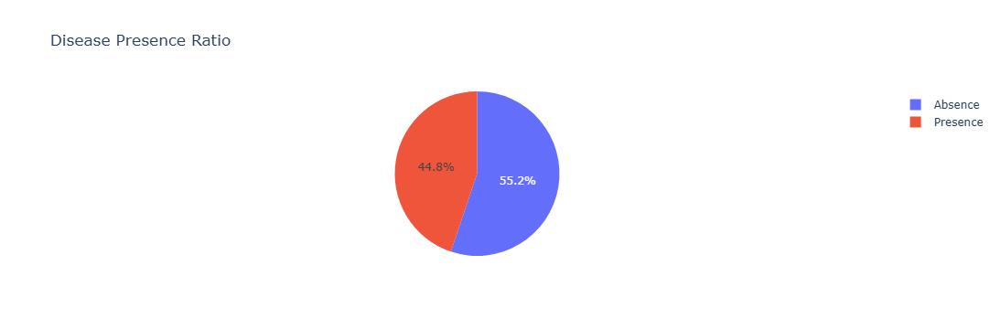

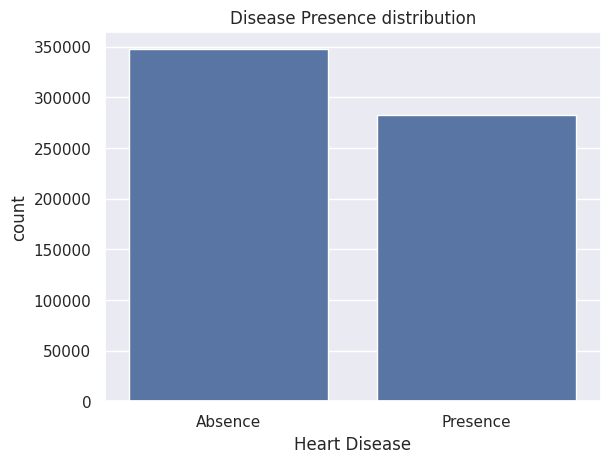

In [24]:
sns.set_theme()

sns.barplot(x=disease_counts["Heart Disease"], y=disease_counts["count"]).set_title("Disease Presence distribution")

fig = px.pie(disease_counts, values="count", names="Heart Disease", title='Disease Presence Ratio')
fig.show()

## Heart Disease Bivariate Analysis

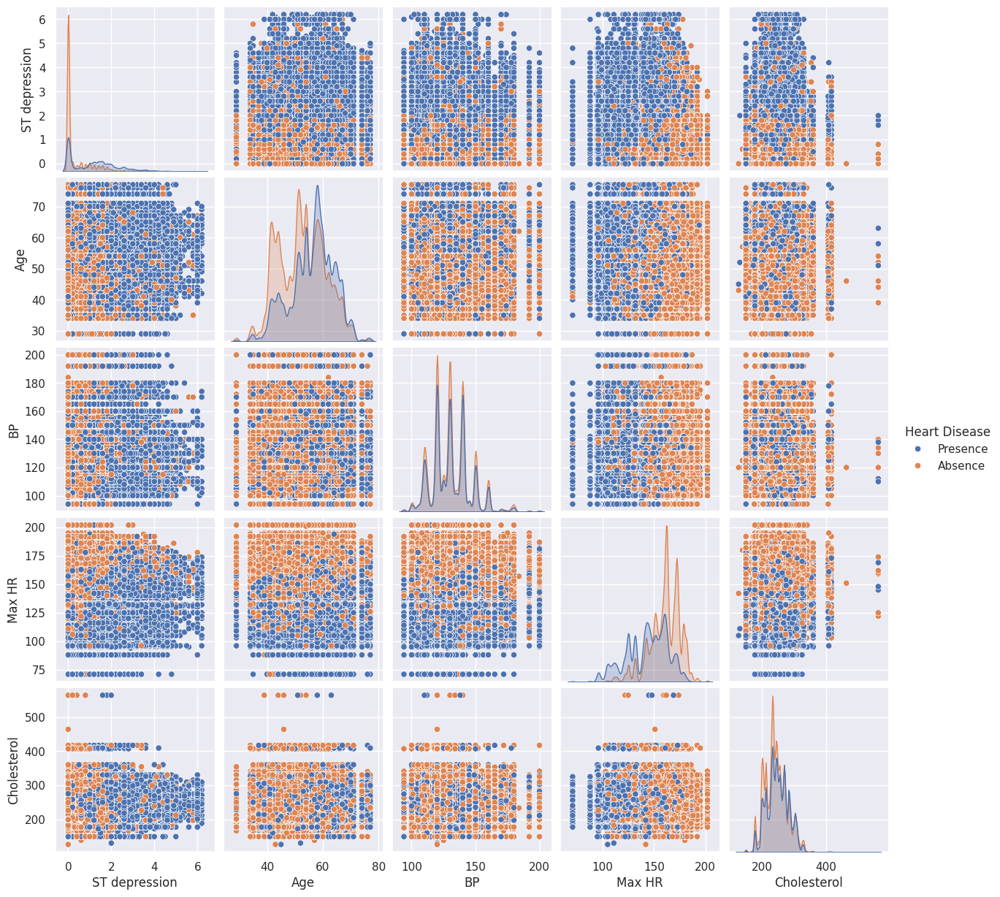

In [142]:
sns.pairplot(data[quantitative+["Heart Disease"]], hue="Heart Disease")

### Show the joint distribution using kernel density estimation

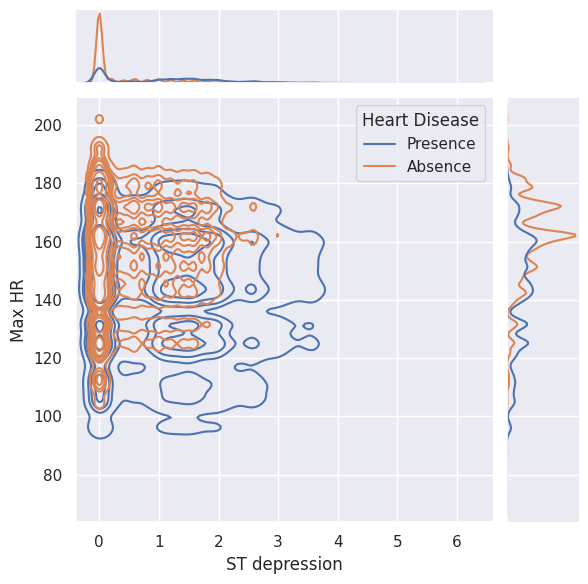

In [143]:
g = sns.jointplot(
    data=data,
    x="ST depression", y="Max HR", hue="Heart Disease",
    kind="kde",
)

<Axes: xlabel='ST depression', ylabel='Max HR'>

/home/akamara/dev/.mlvenv/lib/python3.12/site-packages/IPython/core/events.py:96: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/home/akamara/dev/.mlvenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



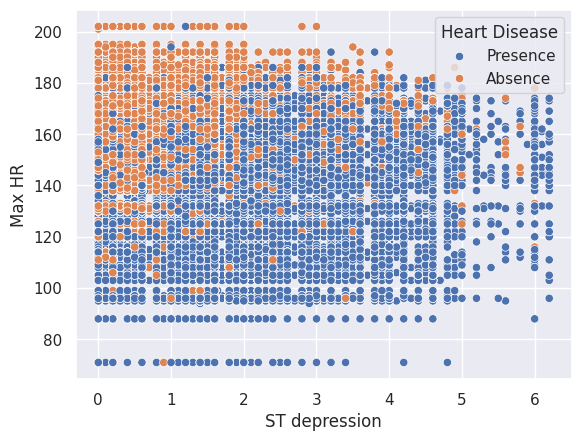

In [144]:
sns.scatterplot(
    data=data,
    x="ST depression", y="Max HR", hue="Heart Disease",
)

## Correlation Analyses

### Correlation between quantitative variables and disease presence
We will be using correlation ratio as refered to in [wikipedia link](https://fr.wikipedia.org/wiki/Rapport_de_corr%C3%A9lation

La variabilité est mesurée par la somme des carrés des écarts (SCE). Soit:

- $$ {\displaystyle SCE_{totale}=\sum _{j}\sum _{i\in J_{j}}(y_{ij}-{\bar {y}})^{2}} $$;

- $$ {\displaystyle SCE_{intra}=\sum _{j}\sum _{i\in J_{j}}(y_{ij}-{\overline {y}}_{.j})^{2}}$$ ;

- $$ {\displaystyle SCE_{inter}=\sum _{j}\sum _{i\in J_{j}}({\overline {y}}_{.j}-{\overline {y}})^{2}}$$

- L’équation d’analyse de variance à un facteur s’écrit :{\displaystyle SCE_{totale}=SCE_{inter}+SCE_{intra}}

- Le carré du rapport de corrélation, noté ${\displaystyle \eta ^{2}}$, est défini par : $${\displaystyle \eta ^{2}(y,x)={\frac {SCE_{inter}}{SCE_{totale}}}}$$

In [30]:
SCETotal = data[quantitative].pipe(lambda x : (x - x.mean())**2).sum()
SCETotal

ST depression    5.667462e+05
Age              4.294483e+07
BP               1.412928e+08
Max HR           2.301411e+08
Cholesterol      7.147017e+08
dtype: float64

In [16]:
data.query("`Heart Disease`=='Presence'")[["Age"]].mean()

Age    56.079114
dtype: float64

In [17]:
data.Age[0]

np.int64(58)

In [18]:
(data.Age[0] - 56.079114)**2

np.float64(3.6898030249960114)

In [19]:
data[quantitative+["Heart Disease"]].groupby("Heart Disease").transform(lambda x : (x - x.mean())**2)

,ST depression,Age,BP,Max HR,Cholesterol
id,,,,,
0,5.909256,3.689804,466.069114,211.197286,82.875260
1,0.120970,0.311468,30.995731,112.040007,6806.398125
2,0.120970,11.846724,866.279061,88.644198,2970.152149
3,0.425354,73.240956,11.782873,108.474407,182.225762
4,6.921615,3.689804,91.941900,341.043817,198.911110
...,...,...,...,...,...
629995,0.120970,11.846724,423.017162,807.418179,272.220376
629996,0.120970,2.079096,6.591445,108.474407,42.261671
629997,1.366804,119.265756,0.169222,30.609976,723.417139


In [20]:
SCEintra = data[quantitative+["Heart Disease"]].groupby("Heart Disease").transform(lambda x : (x - x.mean())**2).sum()
SCEintra

ST depression    4.616424e+05
Age              4.101305e+07
BP               1.412890e+08
Max HR           1.853860e+08
Cholesterol      7.098074e+08
dtype: float64

In [21]:
data[quantitative+["Heart Disease"]].groupby("Heart Disease").mean()

,ST depression,Age,BP,Max HR,Cholesterol
Heart Disease,,,,,
Absence,0.347808,52.558093,130.567381,160.415105,242.499102
Presence,1.169104,56.079114,130.411366,143.467372,248.103585


In [22]:
data[quantitative].mean()

ST depression      0.716028
Age               54.136706
BP               130.497433
Max HR           152.816763
Cholesterol      245.011814
dtype: float64

In [23]:
data[quantitative+["Heart Disease"]].groupby("Heart Disease").mean() - data[quantitative].mean()

,ST depression,Age,BP,Max HR,Cholesterol
Heart Disease,,,,,
Absence,-0.368219,-1.578613,0.069948,7.598341,-2.512712
Presence,0.453076,1.942407,-0.086067,-9.349392,3.091771


In [24]:
0.347808 - 0.716028

-0.36822

In [25]:
(-0.36822)**2

0.1355859684

In [26]:
data[quantitative+["Heart Disease"]].groupby("Heart Disease").count()

,ST depression,Age,BP,Max HR,Cholesterol
Heart Disease,,,,,
Absence,347546,347546,347546,347546,347546
Presence,282454,282454,282454,282454,282454


In [27]:
data[quantitative+["Heart Disease"]].groupby("Heart Disease").pipe(lambda x : ((x.mean() - data[quantitative].mean())**2)*x.count())

,ST depression,Age,BP,Max HR,Cholesterol
Heart Disease,,,,,
Absence,47122.217149,8.660916e+05,1700.430414,2.006550e+07,2.194309e+06
Presence,57981.611453,1.065684e+06,2092.297467,2.468962e+07,2.699991e+06


In [28]:
SCEinter = data[quantitative+["Heart Disease"]].groupby("Heart Disease").pipe(lambda x : ((x.mean() - data[quantitative].mean())**2)*x.count()).sum()
SCEinter

ST depression    1.051038e+05
Age              1.931775e+06
BP               3.792728e+03
Max HR           4.475512e+07
Cholesterol      4.894300e+06
dtype: float64

In [31]:
#H Disease Presence explains 19.4% of variations in Maximum heart rate
#H Disease Presence explains 18.6% of variations in ST depression
#Age, Cholesterol, BP taken seperately don't seem to have variations linked to Heart Disease
mu2 = (SCEinter)/SCETotal
mu2

ST depression    0.185451
Age              0.044983
BP               0.000027
Max HR           0.194468
Cholesterol      0.006848
dtype: float64

In [32]:
((SCEinter+SCEintra)-SCETotal).round()

ST depression    0.0
Age              0.0
BP               0.0
Max HR           0.0
Cholesterol      0.0
dtype: float64

### Correlation between qualitative variables and disease presence
We will be using cramer's V to get relationship intensity. It is refered to in [wikipedia link](https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V)

Let a sample of size n of the simultaneously distributed variables ${\displaystyle A}$ and ${\displaystyle B}$ for ${\displaystyle i=1,\ldots ,r;j=1,\ldots ,k}$ be given by the frequencies ${\displaystyle n_{ij}=}$ number of times the values ${\displaystyle (A_{i},B_{j})}$ were observed.The chi-squared statistic then is:${\displaystyle \chi ^{2}=\sum _{i,j}{\frac {(n_{ij}-{\frac {n_{i.}n_{.j}}{n}})^{2}}{\frac {n_{i.}n_{.j}}{n}}}\;,}$ where ${\displaystyle n_{i.}=\sum _{j}n_{ij}}$ is the number of times the value ${\displaystyle A_{i}}$ is observed and ${\displaystyle n_{.j}=\sum _{i}n_{ij}}$ is the number of times the value ${\displaystyle B_{j}}$ is observed.Cramér's V is computed by taking the square root of the chi-squared statistic divided by the sample size and the minimum dimension minus 1:${\displaystyle V={\sqrt {\frac {\varphi ^{2}}{\min(k-1,r-1)}}}={\sqrt {\frac {\chi ^{2}/n}{\min(k-1,r-1)}}}\;,}$ ${\displaystyle \varphi }$ is the phi ${\displaystyle \chi ^{2}}$ is derived from Pearson's chi-squared ${\displaystyle n}$ is the grand total of observations ${\displaystyle k}$ being the number of columns. ${\displaystyle r}$ being the number of rows.

In [34]:
data.groupby("FBS over 120")[["Heart Disease" ]].count()

,Heart Disease
FBS over 120,
0,579608
1,50392


In [37]:
contitab = pandas.crosstab(index=data["FBS over 120"],
    columns=data["Heart Disease"],margins=True)
contitab

Heart Disease,Absence,Presence,All
FBS over 120,,,
0,322600,257008,579608
1,24946,25446,50392
All,347546,282454,630000


In [40]:
contitab.values

array([[322600, 257008, 579608],
       [ 24946,  25446,  50392],
       [347546, 282454, 630000]])

In [43]:
contitab.values[0,2]

np.int64(579608)

In [44]:
contitab.values[2,0]

np.int64(347546)

In [45]:
contitab.values[2,2]

np.int64(630000)

In [47]:
tab_effectif_theoriq = numpy.array([
    [contitab.values[2,0]*contitab.values[0,2],  contitab.values[2,1]*contitab.values[0,2]],
    [contitab.values[2,0]*contitab.values[1,2], contitab.values[2,1]*contitab.values[1,2]]
])/contitab.values[2,2]
tab_effectif_theoriq

array([[319746.73328254, 259861.26671746],
       [ 27799.26671746,  22592.73328254]])

In [49]:
contitab.values[:2,:2]

array([[322600, 257008],
       [ 24946,  25446]])

In [50]:
tab_ecart = contitab.values[:2,:2] - tab_effectif_theoriq
tab_ecart

array([[ 2853.26671746, -2853.26671746],
       [-2853.26671746,  2853.26671746]])

In [52]:
R2 = tab_ecart**2
R2

array([[8141130.96096666, 8141130.96096683],
       [8141130.96096676, 8141130.96096676]])

In [53]:
R2_T0 = R2/tab_effectif_theoriq
R2_T0

array([[ 25.46118572,  31.32875886],
       [292.85416208, 360.34289695]])

In [54]:
khi2 = R2_T0.sum()
khi2

np.float64(709.9870036064026)

In [55]:
from scipy.stats import chi2_contingency


In [56]:
chi2_contingency(contitab.values[:2,:2])

Chi2ContingencyResult(statistic=np.float64(709.7381923785547), pvalue=np.float64(2.2808195822739196e-156), dof=1, expected_freq=array([[319746.73328254, 259861.26671746],
       [ 27799.26671746,  22592.73328254]]))

In [57]:
r,k = contitab.values.shape
r -=1
k -= 1
r,k

(2, 2)

In [113]:
phi = khi2/contitab.values[2,2]
phi

np.float64(0.0011269634977879406)

In [114]:
V = (phi/min(r-1,k-1))**.5
V

np.float64(0.033570276998975454)

In [74]:
contitab.values[:-1,:-1]

array([[322600, 257008],
       [ 24946,  25446]])

In [80]:
contitab.All[:-1]

FBS over 120
0    579608
1     50392
Name: All, dtype: int64

In [83]:
contitab.loc['All'][:-1]

Heart Disease
Absence     347546
Presence    282454
Name: All, dtype: int64

In [ ]:
totr,totcol = contitabcontitab.values

In [103]:
contitab.values[:-1,:-1]

array([[322600, 257008],
       [ 24946,  25446]])

In [110]:
def cramersV(C1,C2):
    contitab = pandas.crosstab(index=C1,columns=C2,margins=True)
    tab_effectif_theoriq = numpy.array([
        
    [rt*kt for rt in contitab.loc['All'][:-1]]
        
        for kt in contitab.All[:-1]
    ])/contitab.values[-1,-1]
    tab_ecart = contitab.values[:-1,:-1] - tab_effectif_theoriq
    R2 = tab_ecart**2
    R2_T0 = R2/tab_effectif_theoriq
    khi2 = R2_T0.sum()
    r,k = contitab.values.shape
    r -=1
    k -= 1
    phi = khi2/contitab.values[-1,-1]
    V = (phi/min(r-1,k-1))**.5
    return V

In [115]:
cramersV_values = pandas.Series([
    cramersV(data[C1],data["Heart Disease"])
    for C1 in all_qualitative_variables
],index=all_qualitative_variables)

In [116]:
#Thallium presence is highly associated to Heart Disease presence(60%)
# Chest pain type is alse highly associated to Heart Disease presence(52%)
cramersV_values

FBS over 120               0.033570
Exercise angina            0.441864
Sex                        0.342446
Chest pain type            0.525192
Slope of ST                0.429761
Number of vessels fluro    0.463237
EKG results                0.219120
Thallium                   0.605813
dtype: float64

### Indepedant Variables' correlations

#### Quantitative Variables 
We will be using Pearson's correlation coefficient as refered to in [wikipedia link](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient)

$${\displaystyle \rho _{X,Y}={\frac {\operatorname {cov} (X,Y)}{\sigma _{X}\sigma _{Y}}}}$$ 
- where ${\displaystyle \operatorname {cov} }$ is the covariance
- ${\displaystyle \sigma _{X}}$ is the standard deviation of ${\displaystyle X}$
- ${\displaystyle \sigma _{Y}}$ is the standard deviation of ${\displaystyle Y}$.

In [129]:
data[quantitative].\
            pipe(lambda X : (X-X.mean())/X.std()).\
            pipe(lambda X : (X.values.T.dot(X.values))/(X.shape[0]-1))

array([[ 1.        ,  0.10306428, -0.00402443, -0.22946243,  0.04467817],
       [ 0.10306428,  1.        , -0.00395976, -0.0975415 ,  0.01948455],
       [-0.00402443, -0.00395976,  1.        ,  0.00439071, -0.00459651],
       [-0.22946243, -0.0975415 ,  0.00439071,  1.        , -0.04857458],
       [ 0.04467817,  0.01948455, -0.00459651, -0.04857458,  1.        ]])

In [132]:
quant_corr_mat = data[quantitative].corr()
quant_corr_mat

,ST depression,Age,BP,Max HR,Cholesterol
ST depression,1.000000,0.103064,-0.004024,-0.229462,0.044678
Age,0.103064,1.000000,-0.003960,-0.097542,0.019485
BP,-0.004024,-0.003960,1.000000,0.004391,-0.004597
Max HR,-0.229462,-0.097542,0.004391,1.000000,-0.048575
Cholesterol,0.044678,0.019485,-0.004597,-0.048575,1.000000


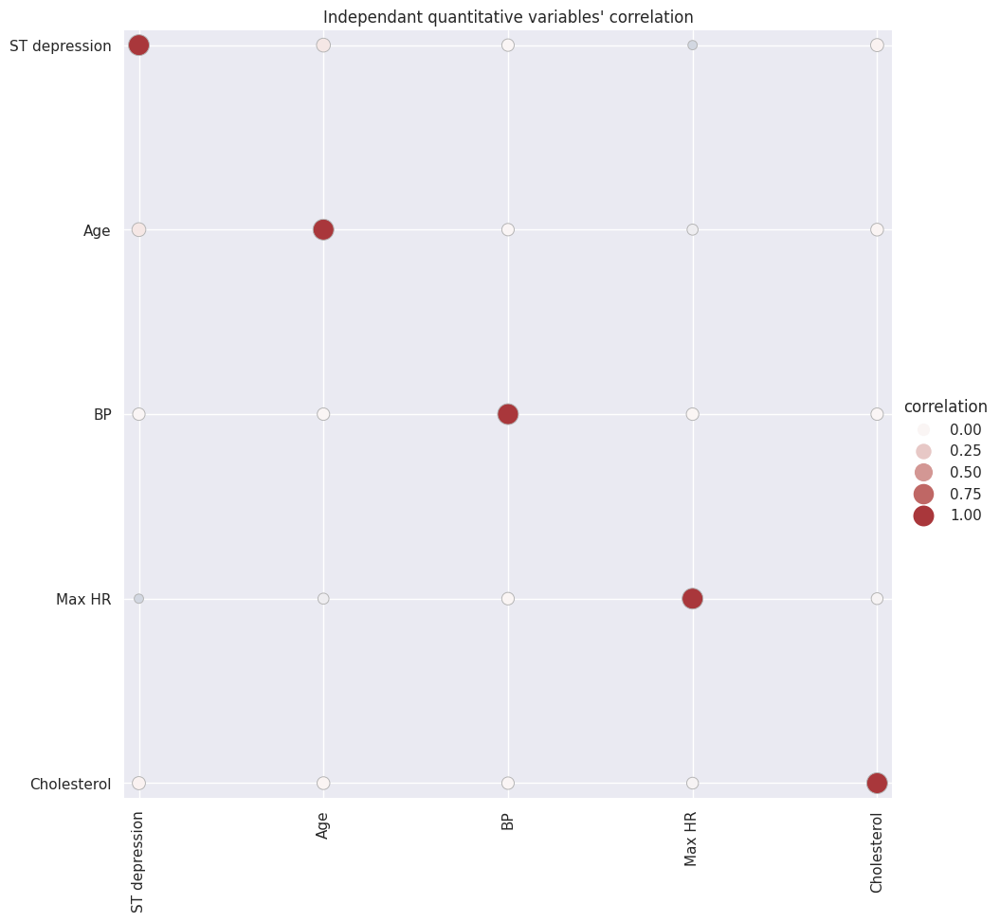

In [140]:
g = sns.relplot(
    data=quant_corr_mat.stack().reset_index(name="correlation"),
    x="level_0", y="level_1", hue="correlation", size="correlation",
    palette="vlag", hue_norm=(-1, 1), edgecolor=".7",
    height=10, sizes=(50, 250), size_norm=(-.2, .8),
)

g.set(xlabel="", ylabel="", aspect="equal",title="Independant quantitative variables' correlation")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)

#### Qualitative variables 

In [134]:
qual_corr_mat = pandas.DataFrame([[cramersV(data[C1],data[C2])
  for C2 in all_qualitative_variables]
for C1 in all_qualitative_variables],
                                 index=all_qualitative_variables,
                                 columns=all_qualitative_variables)
qual_corr_mat

,FBS over 120,Exercise angina,Sex,Chest pain type,Slope of ST,Number of vessels fluro,EKG results,Thallium
FBS over 120,1.000000,0.027971,0.020333,0.027091,0.031038,0.027964,0.016405,0.032946
Exercise angina,0.027971,1.000000,0.192705,0.282810,0.253644,0.286262,0.128851,0.357076
Sex,0.020333,0.192705,1.000000,0.222340,0.176267,0.186585,0.093626,0.275311
Chest pain type,0.027091,0.282810,0.222340,1.000000,0.196281,0.165262,0.098379,0.257104
Slope of ST,0.031038,0.253644,0.176267,0.196281,1.000000,0.189294,0.106109,0.219645
Number of vessels fluro,0.027964,0.286262,0.186585,0.165262,0.189294,1.000000,0.097869,0.249647
EKG results,0.016405,0.128851,0.093626,0.098379,0.106109,0.097869,1.000000,0.119594
Thallium,0.032946,0.357076,0.275311,0.257104,0.219645,0.249647,0.119594,1.000000


Text(0.5, 1.0, "Independant qualitative variables' link intensity")

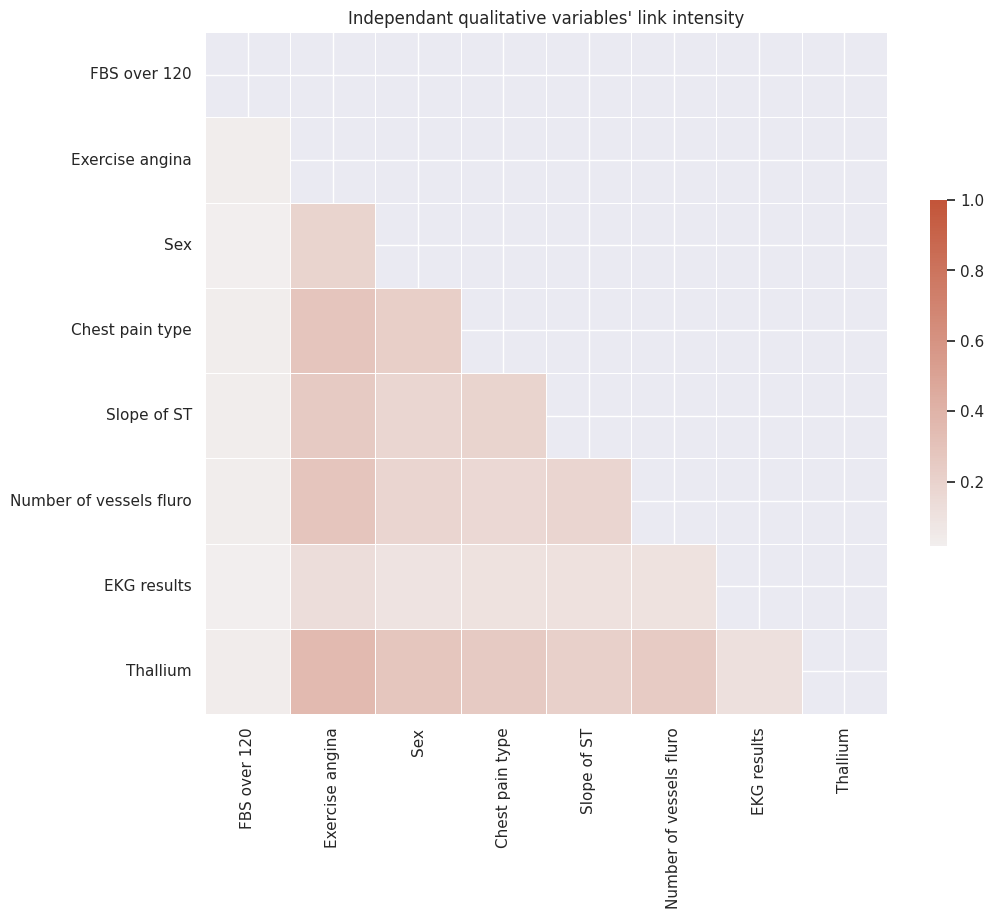

In [137]:
# Generate a mask for the upper triangle
mask = numpy.triu(numpy.ones_like(qual_corr_mat, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(qual_corr_mat, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}).set_title("Independant qualitative variables' link intensity")

# 2. Machine Learning

## Train test split ⚠️

In [45]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop("Heart Disease",axis=1), 
    data["Heart Disease"]=="Presence", 
    stratify=data["Thallium"],
    test_size=0.2, 
    random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((504000, 13), (126000, 13), (504000,), (126000,))

## Benchmarking with a simple model
Summary

We obtain 88.5% of accuray with Logistic Regression

In [29]:
num_pipeline = Pipeline([
('trinome',PolynomialFeatures(degree=3)),
('std_scaler', StandardScaler()),
])
full_pipeline = ColumnTransformer([
("num", num_pipeline, quantitative),
("cat", OneHotEncoder(), qualitative_variables),
("cat_ordinal", OrdinalEncoder(), ordered_qualitative_variables),
])
full_pipeline.fit_transform(data).shape

(630000, 70)

In [12]:
mod = LogisticRegression().fit(full_pipeline.fit_transform(X_train),y_train)    # Describe model

(mod.predict(full_pipeline.fit_transform(X_train))==y_train).sum()/y_train.shape[0]

np.float64(0.8852698412698413)

### Quantitative variables

In [13]:
quantitative

['ST depression', 'Age', 'BP', 'Max HR', 'Cholesterol']

In [19]:
quantipipe = Pipeline([
    ('trinomes', PolynomialFeatures(degree=3)),
    ('std_scaler', StandardScaler()),
    ])

## Building TSNE predictor

In [ ]:
#from sklearn.manifold import TSNE

#X_embedded = TSNE(n_components = 2,n_jobs = 4 ).fit_transform(full_pipeline.fit_transform(X_train))
#X_embedded.shape

In [ ]:
#X_embedded.shape

(504000, 2)

In [ ]:
#numpy.save('data/output/X_embedded.npy',X_embedded)

In [15]:
X_embedded = numpy.load('data/output/X_embedded.npy')
X_embedded.shape

(504000, 2)

<Axes: >

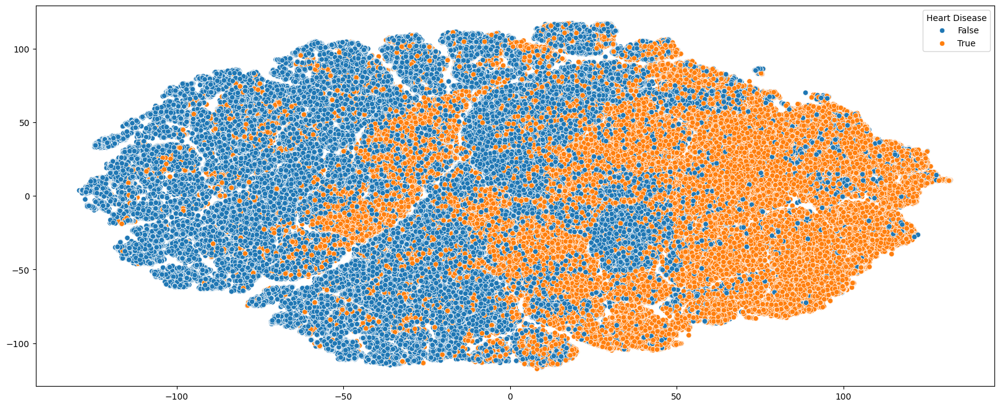

In [ ]:
fig, ax = plt.subplots(figsize=(20,8))
sns.scatterplot(x=X_embedded[:,0],y= X_embedded[:,1], hue=y_train,ax=ax)

Text(0.5, 1.0, 'Heart Data Embedding with tsne')

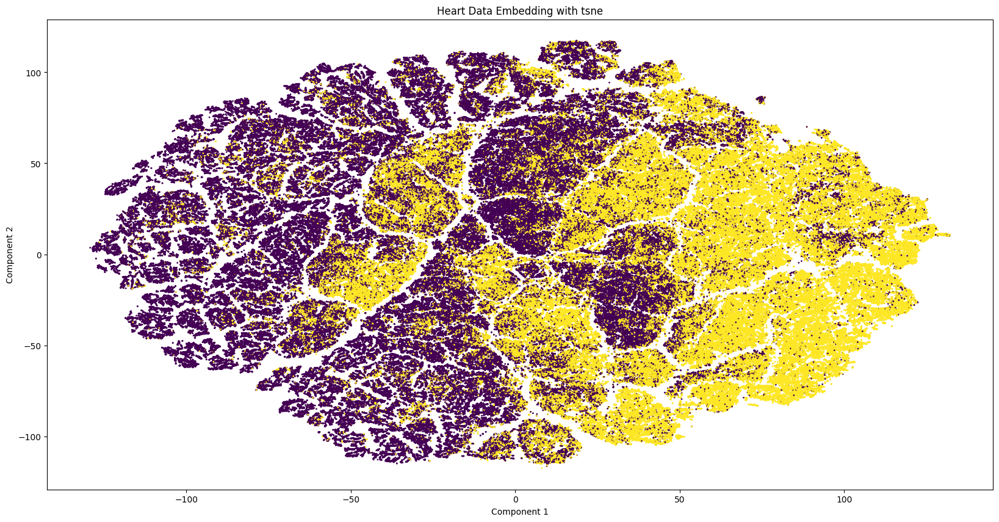

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(X_embedded[:,0], X_embedded[:,1], c=y_train,s=1)
ax.set_ylabel('Component 2')
ax.set_xlabel('Component 1')
ax.set_title('Heart Data Embedding with tsne')

In [20]:
mod = LogisticRegression().fit(X_embedded,y_train)    # Describe model

(mod.predict(X_embedded)==y_train).sum()/y_train.shape[0]

np.float64(0.7635297619047619)

In [21]:
y_embedded = mod.predict(X_embedded)
y_embedded

array([False, False,  True, ...,  True,  True, False], shape=(504000,))

In [24]:
tsne_predictor = LogisticRegression(max_iter=1000).fit(
    full_pipeline.fit_transform(X_train),y_embedded) 

In [25]:
projected_tsne = tsne_predictor.predict(full_pipeline.transform(X_train))

In [28]:
(projected_tsne == y_train).sum()/y_train.shape[0]

np.float64(0.7710039682539682)

In [29]:
joblib.dump(tsne_predictor, 'data/output/embeddors/tsne_model.pkl')

['data/output/embeddors/tsne_model.pkl']

Text(0.5, 1.0, 'Heart Data Embedding with tsne')

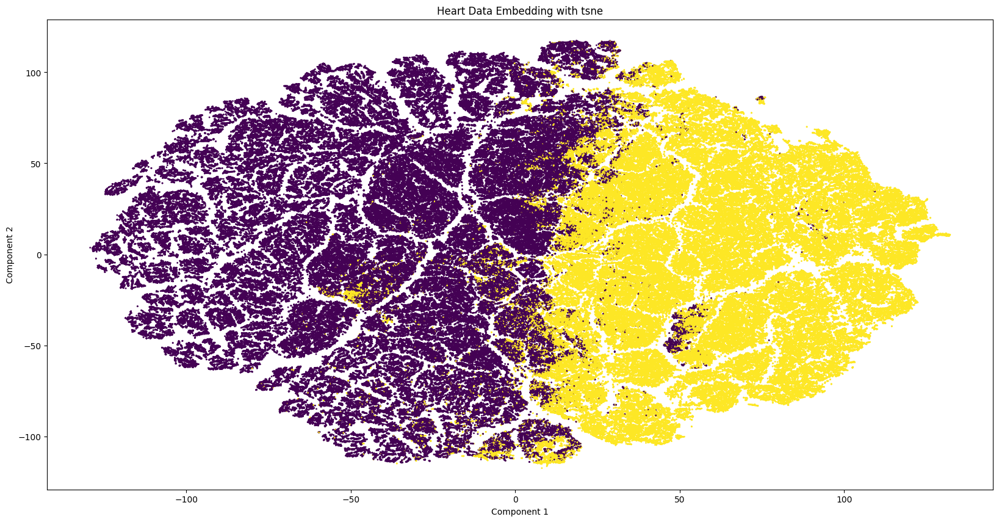

In [18]:
fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(X_embedded[:,0], X_embedded[:,1], c=joblib.load('data/output/embeddors/tsne_model.pkl').predict(full_pipeline.transform(X_train)),s=1)
ax.set_ylabel('Component 2')
ax.set_xlabel('Component 1')
ax.set_title('Heart Data Embedding with tsne')

In [42]:
joblib.load('data/output/embeddors/tsne_model.pkl').predict(full_pipeline.transform(X_train)).ndim

1

##  PCA transformer

In [23]:
pca = PCA(n_components = .95).fit(full_pipeline.fit_transform(X_train))
pca

,"n_components n_components: int, float or 'mle', default=NoneNumber of components to keep.if n_components is not set all components are kept:: n_components == min(n_samples, n_features)If ``n_components == 'mle'`` and ``svd_solver == 'full'``, Minka'sMLE is used to guess the dimension. Use of ``n_components == 'mle'``will interpret ``svd_solver == 'auto'`` as ``svd_solver == 'full'``.If ``0 < n_components < 1`` and ``svd_solver == 'full'``, select thenumber of components such that the amount of variance that needs to beexplained is greater than the percentage specified by n_components.If ``svd_solver == 'arpack'``, the number of components must bestrictly less than the minimum of n_features and n_samples.Hence, the None case results in:: n_components == min(n_samples, n_features) - 1",0.95
,"copy copy: bool, default=TrueIf False, data passed to fit are overwritten and runningfit(X).transform(X) will not yield the expected results,use fit_transform(X) instead.",True
,"whiten whiten: bool, default=FalseWhen True (False by default) the `components_` vectors are multipliedby the square root of n_samples and then divided by the singular valuesto ensure uncorrelated outputs with unit component-wise variances.Whitening will remove some information from the transformed signal(the relative variance scales of the components) but can sometimeimprove the predictive accuracy of the downstream estimators bymaking their data respect some hard-wired assumptions.",False
,"svd_solver svd_solver: {'auto', 'full', 'covariance_eigh', 'arpack', 'randomized'}, default='auto'""auto"" : The solver is selected by a default 'auto' policy is based on `X.shape` and `n_components`: if the input data has fewer than 1000 features and more than 10 times as many samples, then the ""covariance_eigh"" solver is used. Otherwise, if the input data is larger than 500x500 and the number of components to extract is lower than 80% of the smallest dimension of the data, then the more efficient ""randomized"" method is selected. Otherwise the exact ""full"" SVD is computed and optionally truncated afterwards.""full"" : Run exact full SVD calling the standard LAPACK solver via `scipy.linalg.svd` and select the components by postprocessing""covariance_eigh"" : Precompute the covariance matrix (on centered data), run a classical eigenvalue decomposition on the covariance matrix typically using LAPACK and select the components by postprocessing. This solver is very efficient for n_samples >> n_features and small n_features. It is, however, not tractable otherwise for large n_features (large memory footprint required to materialize the covariance matrix). Also note that compared to the ""full"" solver, this solver effectively doubles the condition number and is therefore less numerical stable (e.g. on input data with a large range of singular values).""arpack"" : Run SVD truncated to `n_components` calling ARPACK solver via `scipy.sparse.linalg.svds`. It requires strictly `0 < n_components < min(X.shape)`""randomized"" : Run randomized SVD by the method of Halko et al... versionadded:: 0.18.0.. versionchanged:: 1.5 Added the 'covariance_eigh' solver.",'auto'
,"tol tol: float, default=0.0Tolerance for singular values computed by svd_solver == 'arpack'.Must be of range [0.0, infinity)... versionadded:: 0.18.0",0.0
,"iterated_power iterated_power: int or 'auto', default='auto'Number of iterations for the power method computed bysvd_solver == 'randomized'.Must be of range [0, infinity)... versionadded:: 0.18.0",'auto'
,"n_oversamples n_oversamples: int, default=10This parameter is only relevant when `svd_solver=""randomized""`.It corresponds to the additional number of random vectors to sample therange of `X` so as to ensure proper conditioning. See:func:`~sklearn.utils.extmath.randomized_svd` for more details... versionadded:: 1.1",10
,"power_iteration_normalizer power_iteration_normalizer: {'auto', 'QR', 'LU', 'none'}, default='auto'Power iteration normalizer for randomized S

In [25]:
os.makedirs('data/output/decomposer/',exist_ok=True)

In [26]:
joblib.dump(pca,'data/output/decomposer/pca.pkl')

['data/output/decomposer/pca.pkl']

In [28]:
joblib.load('data/output/decomposer/pca.pkl').explained_variance_ratio_.cumsum()

array([0.34214076, 0.57134341, 0.69315739, 0.80557004, 0.90498144,
       0.92446581, 0.93985088, 0.95342641])

In [31]:
mod = LogisticRegression().fit(
    joblib.load('data/output/decomposer/pca.pkl').transform(full_pipeline.fit_transform(X_train)),
    y_train)    # Describe model

(mod.predict(joblib.load('data/output/decomposer/pca.pkl').transform(full_pipeline.fit_transform(X_train)))==y_train).sum()/y_train.shape[0]

np.float64(0.8684206349206349)

In [59]:
num_pipeline = Pipeline([
('trinome',PolynomialFeatures(degree=3))#Generate polynomial and interaction features,
('std_scaler', StandardScaler()),
])

normalPipe = ColumnTransformer([
("num", num_pipeline, quantitative),
("cat", OneHotEncoder(), qualitative_variables),
("cat_ordinal", OrdinalEncoder(), ordered_qualitative_variables),
])
normalPipe.fit(X_train)
os.makedirs("data/output/transformers/",exist_ok=True)
joblib.dump(normalPipe,'data/output/transformers/normalPipe.pkl')

['data/output/transformers/normalPipe.pkl']

In [49]:
joblib.load('data/output/transformers/normalPipe.pkl').transform(X_train)

array([[ 0.        , -0.75467644, -2.07643863, ...,  0.        ,
         2.        ,  0.        ],
       [ 0.        , -0.22818158,  0.83143671, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  1.98309684, -1.22830833, ...,  0.        ,
         2.        ,  0.        ],
       ...,
       [ 0.        ,  0.08771534,  0.95259818, ...,  0.        ,
         2.        ,  2.        ],
       [ 0.        ,  1.56190095,  1.92188996, ...,  1.        ,
         2.        ,  2.        ],
       [ 0.        ,  1.35130301, -1.59179274, ...,  1.        ,
         0.        ,  0.        ]], shape=(504000, 70))

## Transformer ⚠️⚠️

In [23]:
class PassData(BaseEstimator,TransformerMixin):
    def __init__(self,Method=None):
        self.Method = Method
    def fit(self,X,y=None):
        self.Method = self.Method or (lambda X : X)
        return self
    def transform(self,X):
        out = self.Method(X)
        if out.ndim == 1: out = out.reshape((-1,1))
        return out
class OnTheFlyTransformer(TransformerMixin, BaseEstimator):
    def __init__(self, transformer,path='data/output/transformers/'):
        self.path = path
        self.transformer = transformer
        self.transformer_path = self.path+self.transformer
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return joblib.load(self.transformer_path).transform(X)
class OnTheFlyEmbeddor(TransformerMixin, BaseEstimator):
    def __init__(self, embeddor,path='data/output/embeddors/'):
        self.path = path
        self.embeddor = embeddor
        self.embeddor_path = self.path+self.embeddor
    def fit(self, X, y=None):
        return self
    def transform(self, X): return joblib.load(self.embeddor_path).predict_proba(X)

Transformer = Pipeline([
    ("normal",OnTheFlyTransformer('normalPipe.pkl')),
    ("enrich",FeatureUnion(
        [   ('pass',PassData()),
            ('tsne_pred',OnTheFlyEmbeddor('tsne_model.pkl')),
            ('pca',OnTheFlyTransformer('pca.pkl',path='data/output/decomposer/'))
        ]
    ))
    
])

## Validation set ⚠️

In [24]:
X_train, X_validation, y_train, y_validation = train_test_split(
    Transformer.fit_transform(X_train), 
    y_train,
    test_size=0.1, 
    random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape 

((453600, 80), (50400, 80), (453600,), (50400,))

## Logistic Regression

In [40]:
lr = LogisticRegression()
# fit model
lr.fit(X_train, y_train)

,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary ` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default solver because it works reasonably well for a wide class of problems.- For :term:`mul

In [42]:
joblib.dump(lr,'data/output/models/weaklearners/lr.pkl')

['data/output/models/weaklearners/lr.pkl']

In [43]:
(joblib.load('data/output/models/weaklearners/lr.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(0.8853064373897708)

In [44]:
(joblib.load('data/output/models/weaklearners/lr.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.8849404761904762)

## Xgboost

In [34]:
bst = XGBClassifier(**{
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "learning_rate": 0.01,
    "max_depth": 2,
    "subsample": 0.9,
    "colsample_bytree": 0.9,
    "n_estimators": 20_000,
    "min_child_weight": 1,
    "gamma": 0,
    "lambda": 0.002,
    "alpha": 1.5,
    "n_jobs": -1,
    "random_state": 42,
    'early_stopping_rounds': 300,
    'enable_categorical': True,
})
# fit model
bst.fit(X_train, y_train,
                    eval_set=[(X_validation, y_validation)])

[0]	validation_0-auc:0.88169
[1]	validation_0-auc:0.88169
[2]	validation_0-auc:0.88169
[3]	validation_0-auc:0.88169
[4]	validation_0-auc:0.88169
[5]	validation_0-auc:0.90235
[6]	validation_0-auc:0.90235
[7]	validation_0-auc:0.90235
[8]	validation_0-auc:0.90235
[9]	validation_0-auc:0.90235
[10]	validation_0-auc:0.90235
[11]	validation_0-auc:0.90407
[12]	validation_0-auc:0.90407
[13]	validation_0-auc:0.90407
[14]	validation_0-auc:0.90407
[15]	validation_0-auc:0.90407
[16]	validation_0-auc:0.90414
[17]	validation_0-auc:0.90414
[18]	validation_0-auc:0.90414
[19]	validation_0-auc:0.90419
[20]	validation_0-auc:0.90419
[21]	validation_0-auc:0.90419
[22]	validation_0-auc:0.90454
[23]	validation_0-auc:0.90494
[24]	validation_0-auc:0.90494
[25]	validation_0-auc:0.90494
[26]	validation_0-auc:0.90494
[27]	validation_0-auc:0.90494
[28]	validation_0-auc:0.90494
[29]	validation_0-auc:0.90494
[30]	validation_0-auc:0.90494
[31]	validation_0-auc:0.90495
[32]	validation_0-auc:0.90495
[33]	validation_0-au

,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'binary:logistic'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.9
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",300
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,True
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes fro

In [36]:
bst.save_model('data/output/models/xgboost/xgb2kaggle.json')

In [37]:
acc = (bst.predict(X_train)==y_train).sum()/y_train.shape[0]
print("Train accuracy : ",acc)
acc = (bst.predict(X_validation)==y_validation).sum()/y_validation.shape[0]
print("Validation accuracy : ",acc)

Train accuracy :  0.8904519400352734
Validation accuracy :  0.888531746031746


In [ ]:
os.makedirs('data/output/models/weaklearners/',exist_ok=True)

In [38]:
bst2 = XGBClassifier()
bst2.load_model("data/output/models/xgboost/xgb2kaggle.json")

In [39]:
(bst2.predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(0.8904519400352734)

In [40]:
(bst2.predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.888531746031746)

## Random Forest

In [52]:
clf = RandomForestClassifier(n_estimators=1000,max_depth=10, random_state=42,n_jobs=-1)
clf.fit(X_train, y_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",1000
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",10
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `metric(

In [53]:
joblib.dump(clf,'data/output/models/weaklearners/rf3.pkl')

['data/output/models/weaklearners/rf3.pkl']

In [54]:
(joblib.load('data/output/models/weaklearners/rf3.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(0.889376102292769)

In [55]:
(joblib.load('data/output/models/weaklearners/rf3.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.8826785714285714)

In [78]:
clf = RandomForestClassifier(n_estimators=1000, random_state=42,n_jobs=-1)
clf.fit(X_train, y_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",1000
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `metri

In [79]:
(clf.predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(1.0)

In [80]:
(clf.predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.8820238095238095)

In [83]:
joblib.dump(clf,'data/output/models/weaklearners/rf2.pkl')

['data/output/models/weaklearners/rf2.pkl']

## Nearest Neighbours

In [120]:
ix = numpy.random.randint(0,X_train.shape[0],size=45000)
knn = KNeighborsClassifier(n_jobs=-1)
knn.fit(X_train[ix,:], y_train.iloc[ix])

,"n_neighbors n_neighbors: int, default=5Number of neighbors to use by default for :meth:`kneighbors` queries.",5
,"weights weights: {'uniform', 'distance'}, callable or None, default='uniform'Weight function used in prediction. Possible values:- 'uniform' : uniform weights. All points in each neighborhood are weighted equally.- 'distance' : weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.- [callable] : a user-defined function which accepts an array of distances, and returns an array of the same shape containing the weights.Refer to the example entitled:ref:`sphx_glr_auto_examples_neighbors_plot_classification.py`showing the impact of the `weights` parameter on the decisionboundary.",'uniform'
,"algorithm algorithm: {'auto', 'ball_tree', 'kd_tree', 'brute'}, default='auto'Algorithm used to compute the nearest neighbors:- 'ball_tree' will use :class:`BallTree`- 'kd_tree' will use :class:`KDTree`- 'brute' will use a brute-force search.- 'auto' will attempt to decide the most appropriate algorithm based on the values passed to :meth:`fit` method.Note: fitting on sparse input will override the setting ofthis parameter, using brute force.",'auto'
,"leaf_size leaf_size: int, default=30Leaf size passed to BallTree or KDTree. This can affect thespeed of the construction and query, as well as the memoryrequired to store the tree. The optimal value depends on thenature of the problem.",30
,"p p: float, default=2Power parameter for the Minkowski metric. When p = 1, this is equivalentto using manhattan_distance (l1), and euclidean_distance (l2) for p = 2.For arbitrary p, minkowski_distance (l_p) is used. This parameter is expectedto be positive.",2
,"metric metric: str or callable, default='minkowski'Metric to use for distance computation. Default is ""minkowski"", whichresults in the standard Euclidean distance when p = 2. See thedocumentation of `scipy.spatial.distance`_ andthe metrics listed in:class:`~sklearn.metrics.pairwise.distance_metrics` for valid metricvalues.If metric is ""precomputed"", X is assumed to be a distance matrix andmust be square during fit. X may be a :term:`sparse graph`, in whichcase only ""nonzero"" elements may be considered neighbors.If metric is a callable function, it takes two arrays representing 1Dvectors as inputs and must return one value indicating the distancebetween those vectors. This works for Scipy's metrics, but is lessefficient than passing the metric name as a string.",'minkowski'
,"metric_params metric_params: dict, default=NoneAdditional keyword arguments for the metric function.",None
,"n_jobs n_jobs: int, default=NoneThe number of parallel jobs to run for neighbors search.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.Doesn't affect :meth:`fit` method.",-1


In [123]:
joblib.dump(knn,'data/output/models/weaklearners/knn.pkl')

['data/output/models/weaklearners/knn.pkl']

In [124]:
(joblib.load('data/output/models/weaklearners/knn.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(0.8524889770723104)

In [125]:
(joblib.load('data/output/models/weaklearners/knn.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.8476388888888889)

## Decision Trees

In [146]:
max_depths = list(range(0,50,5))
accuracies = []
for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth or 2,random_state=42)
    dt.fit(X_train, y_train)
    accuracies.append(
        ((dt.predict(X_train)==y_train).sum()/y_train.shape[0],
        (dt.predict(X_validation)==y_validation).sum()/y_validation.shape[0])
    )
    print(max_depth)
    

0
5
10
15
20
25
30
35
40
45


In [147]:
[a for (_,a) in accuracies]

[np.float64(0.808234126984127),
 np.float64(0.8649206349206349),
 np.float64(0.878829365079365),
 np.float64(0.8671626984126984),
 np.float64(0.8503373015873016),
 np.float64(0.8383730158730158),
 np.float64(0.8305555555555556),
 np.float64(0.8273809523809523),
 np.float64(0.8261706349206349),
 np.float64(0.8252380952380952)]

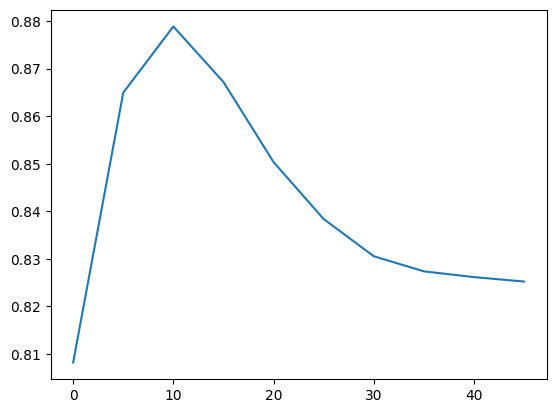

In [148]:
plt.plot(max_depths,[a for (_,a) in accuracies])

In [149]:
dt = DecisionTreeClassifier(max_depth=10,random_state=42)
dt.fit(X_train, y_train)

,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.",'gini'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",10
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... note:: The search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than ``max_features`` features.",None
,"random_state random_state: int, RandomState instance or None, default=NoneControls the randomness of the estimator. The features are alwaysrandomly permuted at each split, even if ``splitter`` is set to``""best""``. When ``max_features < n_features``, the algorithm willselect ``max_features`` at random at each split before finding the bestsplit among them. But the best found split may vary across differentruns, even if ``max_features=n_features``. That is the case, if theimprovement of the criterion is identical for several splits and onesplit has to be selected at random. To obtain a deterministic behaviourduring fitting, ``random_state`` has to be fixed to an integer.See :term:`Glossary ` for details.",42
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow a tree with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current n

In [150]:
joblib.dump(dt,'data/output/models/weaklearners/dt.pkl')

['data/output/models/weaklearners/dt.pkl']

In [151]:
(joblib.load('data/output/models/weaklearners/dt.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(0.8878020282186949)

In [152]:
(joblib.load('data/output/models/weaklearners/dt.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.878829365079365)

## Adaptative Boosting

In [161]:
adaclf = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=1,random_state=42),
    n_estimators=100,
    learning_rate=.5,
    random_state=42
    
    
)

In [ ]:
adaclf.fit(X_train, y_train)

In [164]:
adaclf

,"estimator estimator: object, default=NoneThe base estimator from which the boosted ensemble is built.Support for sample weighting is required, as well as proper``classes_`` and ``n_classes_`` attributes. If ``None``, thenthe base estimator is :class:`~sklearn.tree.DecisionTreeClassifier`initialized with `max_depth=1`... versionadded:: 1.2 `base_estimator` was renamed to `estimator`.",DecisionTreeC...ndom_state=42)
,"n_estimators n_estimators: int, default=50The maximum number of estimators at which boosting is terminated.In case of perfect fit, the learning procedure is stopped early.Values must be in the range `[1, inf)`.",1000
,"learning_rate learning_rate: float, default=1.0Weight applied to each classifier at each boosting iteration. A higherlearning rate increases the contribution of each classifier. There isa trade-off between the `learning_rate` and `n_estimators` parameters.Values must be in the range `(0.0, inf)`.",0.5
,"random_state random_state: int, RandomState instance or None, default=NoneControls the random seed given at each `estimator` at eachboosting iteration.Thus, it is only used when `estimator` exposes a `random_state`.Pass an int for reproducible output across multiple function calls.See :term:`Glossary `.",42
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.",'gini'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",1
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... note:: The search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than ``max_features`` features.",None


In [165]:
joblib.dump(adaclf,'data/output/models/weaklearners/adaclf.pkl')

['data/output/models/weaklearners/adaclf.pkl']

In [166]:
(joblib.load('data/output/models/weaklearners/adaclf.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]

np.float64(0.8868121693121693)

In [167]:
(joblib.load('data/output/models/weaklearners/adaclf.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]

np.float64(0.8861507936507936)

## Support Vector Machine

In [58]:
svc =  LinearSVC(C=10,random_state=42, loss="hinge")
svc.fit(X_train, y_train)

/home/akamara/dev/.mlvenv/lib/python3.12/site-packages/sklearn/svm/_base.py:1258: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


,"penalty penalty: {'l1', 'l2'}, default='l2'Specifies the norm used in the penalization. The 'l2'penalty is the standard used in SVC. The 'l1' leads to ``coef_``vectors that are sparse.",'l2'
,"loss loss: {'hinge', 'squared_hinge'}, default='squared_hinge'Specifies the loss function. 'hinge' is the standard SVM loss(used e.g. by the SVC class) while 'squared_hinge' is thesquare of the hinge loss. The combination of ``penalty='l1'``and ``loss='hinge'`` is not supported.",'hinge'
,"dual dual: ""auto"" or bool, default=""auto""Select the algorithm to either solve the dual or primaloptimization problem. Prefer dual=False when n_samples > n_features.`dual=""auto""` will choose the value of the parameter automatically,based on the values of `n_samples`, `n_features`, `loss`, `multi_class`and `penalty`. If `n_samples` < `n_features` and optimizer supportschosen `loss`, `multi_class` and `penalty`, then dual will be set to True,otherwise it will be set to False... versionchanged:: 1.3 The `""auto""` option is added in version 1.3 and will be the default in version 1.5.",'auto'
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive.For an intuitive visualization of the effects of scalingthe regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",10
,"multi_class multi_class: {'ovr', 'crammer_singer'}, default='ovr'Determines the multi-class strategy if `y` contains more thantwo classes.``""ovr""`` trains n_classes one-vs-rest classifiers, while``""crammer_singer""`` optimizes a joint objective over all classes.While `crammer_singer` is interesting from a theoretical perspectiveas it is consistent, it is seldom used in practice as it rarely leadsto better accuracy and is more expensive to compute.If ``""crammer_singer""`` is chosen, the options loss, penalty and dualwill be ignored.",'ovr'
,"fit_intercept fit_intercept: bool, default=TrueWhether or not to fit an intercept. If set to True, the feature vectoris extended to include an intercept term: `[x_1, ..., x_n, 1]`, where1 corresponds to the intercept. If set to False, no intercept will beused in calculations (i.e. data is expected to be already centered).",True
,"intercept_scaling intercept_scaling: float, default=1.0When `fit_intercept` is True, the instance vector x becomes ``[x_1,..., x_n, intercept_scaling]``, i.e. a ""synthetic"" feature with aconstant value equal to `intercept_scaling` is appended to the instancevector. The intercept becomes intercept_scaling * synthetic featureweight. Note that liblinear internally penalizes the intercept,treating it like any other term in the feature vector. To reduce theimpact of the regularization on the intercept, the `intercept_scaling`parameter can be set to a value greater than 1; the higher the value of`intercept_scaling`, the lower the impact of regularization on it.Then, the weights become `[w_x_1, ..., w_x_n,w_intercept*intercept_scaling]`, where `w_x_1, ..., w_x_n` representthe feature weights and the intercept weight is scaled by`intercept_scaling`. This scaling allows the intercept term to have adifferent regularization behavior compared to the other features.",1
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to ``class_weight[i]*C`` forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: int, default=0Enable verbose output. Note that this setting takes advantage of aper-process runtime setting in liblinear that, if enabled, may not workproperly in a multithreaded context.",0
,"random_state random_state: int, RandomState instance or None, default=NoneControls the pseudo random number

In [59]:
joblib.dump(svc,'data/output/models/weaklearners/svc.pkl')

['data/output/models/weaklearners/svc.pkl']

In [60]:
joblib.load('data/output/models/weaklearners/svc.pkl')

,"penalty penalty: {'l1', 'l2'}, default='l2'Specifies the norm used in the penalization. The 'l2'penalty is the standard used in SVC. The 'l1' leads to ``coef_``vectors that are sparse.",'l2'
,"loss loss: {'hinge', 'squared_hinge'}, default='squared_hinge'Specifies the loss function. 'hinge' is the standard SVM loss(used e.g. by the SVC class) while 'squared_hinge' is thesquare of the hinge loss. The combination of ``penalty='l1'``and ``loss='hinge'`` is not supported.",'hinge'
,"dual dual: ""auto"" or bool, default=""auto""Select the algorithm to either solve the dual or primaloptimization problem. Prefer dual=False when n_samples > n_features.`dual=""auto""` will choose the value of the parameter automatically,based on the values of `n_samples`, `n_features`, `loss`, `multi_class`and `penalty`. If `n_samples` < `n_features` and optimizer supportschosen `loss`, `multi_class` and `penalty`, then dual will be set to True,otherwise it will be set to False... versionchanged:: 1.3 The `""auto""` option is added in version 1.3 and will be the default in version 1.5.",'auto'
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive.For an intuitive visualization of the effects of scalingthe regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",10
,"multi_class multi_class: {'ovr', 'crammer_singer'}, default='ovr'Determines the multi-class strategy if `y` contains more thantwo classes.``""ovr""`` trains n_classes one-vs-rest classifiers, while``""crammer_singer""`` optimizes a joint objective over all classes.While `crammer_singer` is interesting from a theoretical perspectiveas it is consistent, it is seldom used in practice as it rarely leadsto better accuracy and is more expensive to compute.If ``""crammer_singer""`` is chosen, the options loss, penalty and dualwill be ignored.",'ovr'
,"fit_intercept fit_intercept: bool, default=TrueWhether or not to fit an intercept. If set to True, the feature vectoris extended to include an intercept term: `[x_1, ..., x_n, 1]`, where1 corresponds to the intercept. If set to False, no intercept will beused in calculations (i.e. data is expected to be already centered).",True
,"intercept_scaling intercept_scaling: float, default=1.0When `fit_intercept` is True, the instance vector x becomes ``[x_1,..., x_n, intercept_scaling]``, i.e. a ""synthetic"" feature with aconstant value equal to `intercept_scaling` is appended to the instancevector. The intercept becomes intercept_scaling * synthetic featureweight. Note that liblinear internally penalizes the intercept,treating it like any other term in the feature vector. To reduce theimpact of the regularization on the intercept, the `intercept_scaling`parameter can be set to a value greater than 1; the higher the value of`intercept_scaling`, the lower the impact of regularization on it.Then, the weights become `[w_x_1, ..., w_x_n,w_intercept*intercept_scaling]`, where `w_x_1, ..., w_x_n` representthe feature weights and the intercept weight is scaled by`intercept_scaling`. This scaling allows the intercept term to have adifferent regularization behavior compared to the other features.",1
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to ``class_weight[i]*C`` forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: int, default=0Enable verbose output. Note that this setting takes advantage of aper-process runtime setting in liblinear that, if enabled, may not workproperly in a multithreaded context.",0
,"random_state random_state: int, RandomState instance or None, default=NoneControls the pseudo random number

In [61]:
acc = (joblib.load('data/output/models/weaklearners/svc.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]
print("acc train voter",str(acc))

acc train voter 0.8744797178130511


In [62]:
acc = (joblib.load('data/output/models/weaklearners/svc.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]
print("acc train voter",str(acc))

acc train voter 0.876031746031746


## Ensemble Learner

### On-the-fly classifier 

In [22]:
class OnTheFlyClassifier(ClassifierMixin, BaseEstimator):

    def __init__(self, weaklearner,path='data/output/models/weaklearners/'):
        self.path = path
        self.weaklearner = weaklearner
        self.learner_path = self.path+self.weaklearner

    def fit(self, X, y):

        # Check that X and y have correct shape, set n_features_in_, etc.
        X, y = validate_data(self, X, y)
        # Store the classes seen during fit
        self.classes_ = unique_labels(y)

        self.X_ = X
        self.y_ = y
        # Return the classifier
        return self

    def predict(self, X):

        # Check if fit has been called
        check_is_fitted(self)

        # Input validation
        X = validate_data(self, X, reset=False)

        return joblib.load(self.learner_path).predict(X)

    def predict_proba(self, X):

        # Check if fit has been called
        check_is_fitted(self)

        # Input validation
        X = validate_data(self, X, reset=False)

        return joblib.load(self.learner_path).predict_proba(X)
class XgbLoadedClassifier(ClassifierMixin, BaseEstimator):

    def __init__(self, json):
        self.json = json
        self.model = XGBClassifier()
        self.model.load_model(json)

    def fit(self, X, y):

        # Check that X and y have correct shape, set n_features_in_, etc.
        X, y = validate_data(self, X, y)
        # Store the classes seen during fit
        self.classes_ = unique_labels(y)

        self.X_ = X
        self.y_ = y
        # Return the classifier
        return self

    def predict(self, X):

        # Check if fit has been called
        check_is_fitted(self)

        # Input validation
        X = validate_data(self, X, reset=False)

        return self.model.predict(X)

    def predict_proba(self, X):

        # Check if fit has been called
        check_is_fitted(self)

        # Input validation
        X = validate_data(self, X, reset=False)

        return self.model.predict_proba(X)

In [23]:
!ls -al data/output/models/weaklearners/

total 5850340
drwxr-xr-x 2 akamara akamara       4096 Feb  7 21:26 .
drwxr-xr-x 5 akamara akamara       4096 Feb  9 09:04 ..
-rw-r--r-- 1 akamara akamara     625446 Feb  7 10:55 adaclf.pkl
-rw-r--r-- 1 akamara akamara     152121 Feb  6 23:43 dt.pkl
-rw-r--r-- 1 akamara akamara   29160820 Feb  6 22:53 knn.pkl
-rw-r--r-- 1 akamara akamara       1471 Feb  7 21:26 lr.pkl
-rw-r--r-- 1 akamara akamara     961481 Feb  6 21:58 rf1.pkl
-rw-r--r-- 1 akamara akamara 5959728233 Feb  6 21:48 rf2.pkl
-rw-r--r-- 1 akamara akamara      92817 Feb  6 21:44 xgb.json


### Voting classifier

#### Hard voter

In [24]:
voter = VotingClassifier(
        estimators = [
            ('lr',LogisticRegression(random_state=42)),
            ('xgb',XGBClassifier(**{'objective': 'binary:logistic','base_score': None,'booster': None,'colsample_bylevel': None,'colsample_bynode': None,'colsample_bytree': None,'device': None,'eval_metric': None,'gamma': None,'grow_policy': None,'interaction_constraints': None,'learning_rate': 1,'max_bin': None,'max_cat_threshold': None,'max_cat_to_onehot': None,'max_delta_step': None,'max_depth': 2,'max_leaves': None,'min_child_weight': None,'monotone_constraints': None,'multi_strategy': None,'n_jobs': -1,'num_parallel_tree': None,'random_state': None,'reg_alpha': None,'reg_lambda': None,'sampling_method': None,'scale_pos_weight': None,'subsample': None,'tree_method': None,'validate_parameters': None,'verbosity': None})),
            ('rf1',RandomForestClassifier(n_estimators=1000,max_depth=10, random_state=42,n_jobs=-1)),
            ('dt', DecisionTreeClassifier(max_depth=10,random_state=42)),
            ('ada',AdaBoostClassifier(
                    DecisionTreeClassifier(max_depth=1),
                    n_estimators=100,
                    learning_rate=.5,
                    random_state=42
                    
                    
                )),
            ('svm',LinearSVC(C=10,random_state=42, loss="hinge"))
        ],
    voting='hard',
    n_jobs=-1,
    
)

In [25]:
import gc
gc.collect()

110

In [26]:
voter.fit(X_train,y_train)

/home/akamara/dev/.mlvenv/lib/python3.12/site-packages/sklearn/svm/_base.py:1258: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


,"estimators estimators: list of (str, estimator) tuplesInvoking the ``fit`` method on the ``VotingClassifier`` will fit clonesof those original estimators that will be stored in the class attribute``self.estimators_``. An estimator can be set to ``'drop'`` using:meth:`set_params`... versionchanged:: 0.21 ``'drop'`` is accepted. Using None was deprecated in 0.22 and support was removed in 0.24.","[('lr', ...), ('xgb', ...), ...]"
,"voting voting: {'hard', 'soft'}, default='hard'If 'hard', uses predicted class labels for majority rule voting.Else if 'soft', predicts the class label based on the argmax ofthe sums of the predicted probabilities, which is recommended foran ensemble of well-calibrated classifiers.",'hard'
,"weights weights: array-like of shape (n_classifiers,), default=NoneSequence of weights (`float` or `int`) to weight the occurrences ofpredicted class labels (`hard` voting) or class probabilitiesbefore averaging (`soft` voting). Uses uniform weights if `None`.",None
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for ``fit``.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionadded:: 0.18",-1
,"flatten_transform flatten_transform: bool, default=TrueAffects shape of transform output only when voting='soft'If voting='soft' and flatten_transform=True, transform method returnsmatrix with shape (n_samples, n_classifiers * n_classes). Ifflatten_transform=False, it returns(n_classifiers, n_samples, n_classes).",True
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting will be printed as itis completed... versionadded:: 0.23",False
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001


In [57]:
os.makedirs('data/output/models/stronglearners/',exist_ok=True)

In [27]:
joblib.dump(voter,'data/output/models/stronglearners/hardvoter.pkl')

['data/output/models/stronglearners/hardvoter.pkl']

In [28]:
joblib.load('data/output/models/stronglearners/hardvoter.pkl')

,"estimators estimators: list of (str, estimator) tuplesInvoking the ``fit`` method on the ``VotingClassifier`` will fit clonesof those original estimators that will be stored in the class attribute``self.estimators_``. An estimator can be set to ``'drop'`` using:meth:`set_params`... versionchanged:: 0.21 ``'drop'`` is accepted. Using None was deprecated in 0.22 and support was removed in 0.24.","[('lr', ...), ('xgb', ...), ...]"
,"voting voting: {'hard', 'soft'}, default='hard'If 'hard', uses predicted class labels for majority rule voting.Else if 'soft', predicts the class label based on the argmax ofthe sums of the predicted probabilities, which is recommended foran ensemble of well-calibrated classifiers.",'hard'
,"weights weights: array-like of shape (n_classifiers,), default=NoneSequence of weights (`float` or `int`) to weight the occurrences ofpredicted class labels (`hard` voting) or class probabilitiesbefore averaging (`soft` voting). Uses uniform weights if `None`.",None
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for ``fit``.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionadded:: 0.18",-1
,"flatten_transform flatten_transform: bool, default=TrueAffects shape of transform output only when voting='soft'If voting='soft' and flatten_transform=True, transform method returnsmatrix with shape (n_samples, n_classifiers * n_classes). Ifflatten_transform=False, it returns(n_classifiers, n_samples, n_classes).",True
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting will be printed as itis completed... versionadded:: 0.23",False
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001


In [29]:
#with sklearn.config_context(working_memory=)
acc = (joblib.load('data/output/models/stronglearners/hardvoter.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]
print("acc train voter",str(acc))

acc train voter 0.888425925925926


In [30]:
acc = (joblib.load('data/output/models/stronglearners/hardvoter.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]
print("acc validation voter",str(acc))

acc validation voter 0.8863293650793651


In [39]:
#acc = (xgb.predict(X_train)==y_train).sum()/y_train.shape[0]
#print("acc train voter",str(acc))

acc train voter 0.8890718694885361


In [ ]:
#xgb = XGBClassifier(**{'objective': 'binary:logistic','base_score': None,'booster': None,'colsample_bylevel': None,'colsample_bynode': None,'colsample_bytree': None,'device': None,'eval_metric': None,'gamma': None,'grow_policy': None,'interaction_constraints': None,'learning_rate': 1,'max_bin': None,'max_cat_threshold': None,'max_cat_to_onehot': None,'max_delta_step': None,'max_depth': 2,'max_leaves': None,'min_child_weight': None,'monotone_constraints': None,'multi_strategy': None,'n_jobs': -1,'num_parallel_tree': None,'random_state': None,'reg_alpha': None,'reg_lambda': None,'sampling_method': None,'scale_pos_weight': None,'subsample': None,'tree_method': None,'validate_parameters': None,'verbosity': None})
#xgb.fit(X_train ,y_train)
#acc = (xgb.predict(X_validation)==y_validation).sum()/y_validation.shape[0]
#print("acc validation voter",str(acc))



acc validation voter 0.8877579365079366


#### Soft Voter

In [32]:
voter = VotingClassifier(
    estimators=[
            ('lr',LogisticRegression(random_state=42)),
            ('xgb',XGBClassifier(**{'objective': 'binary:logistic','base_score': None,'booster': None,'colsample_bylevel': None,'colsample_bynode': None,'colsample_bytree': None,'device': None,'eval_metric': None,'gamma': None,'grow_policy': None,'interaction_constraints': None,'learning_rate': 1,'max_bin': None,'max_cat_threshold': None,'max_cat_to_onehot': None,'max_delta_step': None,'max_depth': 2,'max_leaves': None,'min_child_weight': None,'monotone_constraints': None,'multi_strategy': None,'n_jobs': -1,'num_parallel_tree': None,'random_state': None,'reg_alpha': None,'reg_lambda': None,'sampling_method': None,'scale_pos_weight': None,'subsample': None,'tree_method': None,'validate_parameters': None,'verbosity': None})),
            ('rf1',RandomForestClassifier(n_estimators=1000,max_depth=10, random_state=42,n_jobs=-1)),
            ('dt', DecisionTreeClassifier(max_depth=10,random_state=42)),
            ('ada',AdaBoostClassifier(
                    DecisionTreeClassifier(max_depth=1),
                    n_estimators=100,
                    learning_rate=.5,
                    random_state=42
                    
                    
                ))
        ]
    ,
    voting='soft',
    weights=[1,3,1,1,1]
)
voter.fit(X_train, y_train)

,"estimators estimators: list of (str, estimator) tuplesInvoking the ``fit`` method on the ``VotingClassifier`` will fit clonesof those original estimators that will be stored in the class attribute``self.estimators_``. An estimator can be set to ``'drop'`` using:meth:`set_params`... versionchanged:: 0.21 ``'drop'`` is accepted. Using None was deprecated in 0.22 and support was removed in 0.24.","[('lr', ...), ('xgb', ...), ...]"
,"voting voting: {'hard', 'soft'}, default='hard'If 'hard', uses predicted class labels for majority rule voting.Else if 'soft', predicts the class label based on the argmax ofthe sums of the predicted probabilities, which is recommended foran ensemble of well-calibrated classifiers.",'soft'
,"weights weights: array-like of shape (n_classifiers,), default=NoneSequence of weights (`float` or `int`) to weight the occurrences ofpredicted class labels (`hard` voting) or class probabilitiesbefore averaging (`soft` voting). Uses uniform weights if `None`.","[1, 3, ...]"
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for ``fit``.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionadded:: 0.18",None
,"flatten_transform flatten_transform: bool, default=TrueAffects shape of transform output only when voting='soft'If voting='soft' and flatten_transform=True, transform method returnsmatrix with shape (n_samples, n_classifiers * n_classes). Ifflatten_transform=False, it returns(n_classifiers, n_samples, n_classes).",True
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting will be printed as itis completed... versionadded:: 0.23",False
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001


In [34]:
joblib.dump(voter,'data/output/models/stronglearners/softvoter.pkl')

['data/output/models/stronglearners/softvoter.pkl']

In [31]:
import gc
gc.collect()

70

In [35]:
#with sklearn.config_context(working_memory=)
acc = (joblib.load('data/output/models/stronglearners/softvoter.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]
print("acc train voter",str(acc))

acc train voter 0.8902667548500882


In [ ]:

acc = (joblib.load('data/output/models/stronglearners/softvoter.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]
print("acc validation voter",str(acc))

acc validation voter 0.8870833333333333


# 3. Deep Learning

## Main model

In [40]:
X_train.shape

(453600, 80)

In [43]:

# Build the Keras model
model = Sequential([
    Dense(300, activation='relu', input_shape=(X_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(200, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(500, activation='relu'),
    BatchNormalization(),
    Dropout(0.6),
    
    Dense(10, activation='relu'),
    Dropout(0.2),
    
    Dense(1, activation='sigmoid')  # Binary classification
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.AUC()]
)

# Display model architecture
model.summary()


/home/akamara/dev/.mlvenv/lib/python3.12/site-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2026-02-09 07:56:39.142491: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 300)            │        24,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 300)            │         1,200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 200)            │        60,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 200)            │           800 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 500)            │       100,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 500)            │         2,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         5,010 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 194,021 (757.89 KB)

 Trainable params: 192,021 (750.08 KB)

 Non-trainable params: 2,000 (7.81 KB)

In [44]:
# Define early stopping to prevent overfitting
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model
history = model.fit(
    X_train, 
    y_train,
    validation_data=(X_validation,y_validation),
    epochs=100,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/100


2026-02-09 07:58:41.343463: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 145152000 exceeds 10% of free system memory.


14175/14175 ━━━━━━━━━━━━━━━━━━━━ 104s 7ms/step - accuracy: 0.8697 - auc: 0.9371 - loss: 0.3214 - val_accuracy: 0.8830 - val_auc: 0.9512 - val_loss: 0.2808
Epoch 2/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 115s 8ms/step - accuracy: 0.8775 - auc: 0.9437 - loss: 0.3029 - val_accuracy: 0.8841 - val_auc: 0.9517 - val_loss: 0.2791
Epoch 3/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 99s 7ms/step - accuracy: 0.8797 - auc: 0.9452 - loss: 0.2985 - val_accuracy: 0.8841 - val_auc: 0.9518 - val_loss: 0.2790
Epoch 4/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 106s 7ms/step - accuracy: 0.8807 - auc: 0.9458 - loss: 0.2971 - val_accuracy: 0.8843 - val_auc: 0.9518 - val_loss: 0.2799
Epoch 5/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 103s 7ms/step - accuracy: 0.8813 - auc: 0.9462 - loss: 0.2958 - val_accuracy: 0.8843 - val_auc: 0.9518 - val_loss: 0.2791
Epoch 6/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 110s 8ms/step - accuracy: 0.8816 - auc: 0.9465 - loss: 0.2952 - val_accuracy: 0.8840 - val_auc: 0.9519 - val_loss: 0.2795
Epoch 7/100

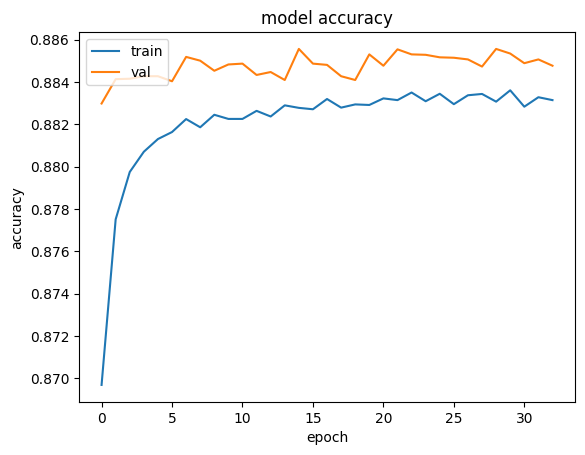

In [46]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [45]:
os.makedirs('data/output/models/deeplearningmodels',exist_ok=True)

In [47]:
model.save("data/output/models/deeplearningmodels/main.keras")

In [26]:
tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras")

2026-02-09 09:21:30.739395: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


<Sequential name=sequential, built=True>

In [42]:
acc = ((tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras"
                          ).predict(X_train)>.5)==y_train.values.reshape((-1,1))
      ).sum()/y_train.shape[0]
print("acc train voter",str(acc))

14175/14175 ━━━━━━━━━━━━━━━━━━━━ 51s 4ms/step
acc train voter 0.8854695767195767


In [43]:
acc = ((tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras"
                          ).predict(X_validation)>.5)==y_validation.values.reshape((-1,1))
      ).sum()/y_validation.shape[0]
print("acc train voter",str(acc))

1575/1575 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step
acc train voter 0.885297619047619


## With residual data

In [45]:
inputs = Input(shape=(X_train.shape[1],))

# Première couche
x1 = Dense(300, activation='relu')(inputs)
x1 = Dropout(0.5)(x1) # 30% des neurones désactivés

# Deuxième couche
x2 = Dense(200, activation='relu')(x1)
x2 = Dropout(0.5)(x2) # 30% des neurones désactivés

# Deuxième couche
x3 = Dense(500, activation='relu')(x2)
x3 = Dropout(0.6)(x3) # 30% des neurones désactivés


# Réinjection de l'input original dans la 3ème couche
concat = Concatenate()([x3, inputs])
x4 = Dense(10, activation='relu')(concat)
x4 = Dropout(0.2)(x4)
# Dernière couche avec sigmoid
outputs = Dense(1, activation='sigmoid')(x4)

# Création du modèle
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.AUC()]
)

# Display model architecture
model.summary()


Model: "functional_108"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 80)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 300)       │     24,300 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 300)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 200)       │     60,200 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 200)       │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 500)       │    100,500 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 500)       │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 580)       │          0 │ dropout_2[0][0],  │
│ (Concatenate)       │                   │            │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 10)        │      5,810 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 10)        │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 1)         │         11 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 190,821 (745.39 KB)

 Trainable params: 190,821 (745.39 KB)

 Non-trainable params: 0 (0.00 B)

In [46]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model
history = model.fit(
    X_train, 
    y_train,
    validation_data=(X_validation,y_validation),
    epochs=100,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 105s 7ms/step - accuracy: 0.8809 - auc: 0.9463 - loss: 0.2945 - val_accuracy: 0.8839 - val_auc: 0.9514 - val_loss: 0.2792
Epoch 2/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 101s 7ms/step - accuracy: 0.8837 - auc: 0.9489 - loss: 0.2872 - val_accuracy: 0.8837 - val_auc: 0.9515 - val_loss: 0.2797
Epoch 3/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 137s 7ms/step - accuracy: 0.8842 - auc: 0.9491 - loss: 0.2865 - val_accuracy: 0.8838 - val_auc: 0.9517 - val_loss: 0.2793
Epoch 4/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 88s 6ms/step - accuracy: 0.8845 - auc: 0.9493 - loss: 0.2861 - val_accuracy: 0.8841 - val_auc: 0.9519 - val_loss: 0.2781
Epoch 5/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 89s 6ms/step - accuracy: 0.8844 - auc: 0.9494 - loss: 0.2859 - val_accuracy: 0.8842 - val_auc: 0.9518 - val_loss: 0.2787
Epoch 6/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 89s 6ms/step - accuracy: 0.8844 - auc: 0.9494 - loss: 0.2861 - val_accuracy: 0.8838 - val_auc: 0.9516 - val_loss: 0.2798
E

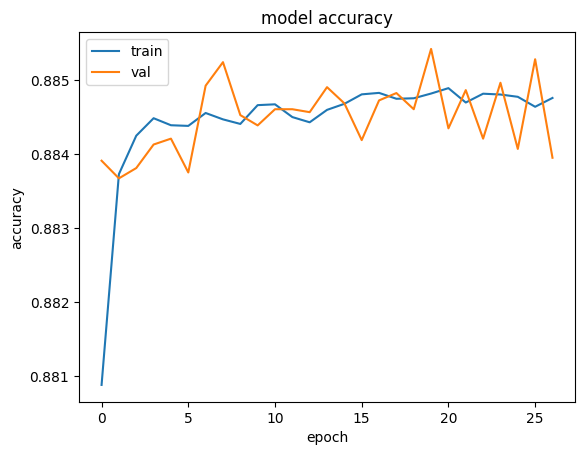

In [47]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [48]:
model.save("data/output/models/deeplearningmodels/residual.keras")

In [49]:
tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras")

<Functional name=functional_108, built=True>

In [50]:
acc = ((tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras"
                          ).predict(X_train)>.5)==y_train.values.reshape((-1,1))
      ).sum()/y_train.shape[0]
print("acc train voter",str(acc))

14175/14175 ━━━━━━━━━━━━━━━━━━━━ 41s 3ms/step
acc train voter 0.8853240740740741


In [51]:
acc = ((tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras"
                          ).predict(X_validation)>.5)==y_validation.values.reshape((-1,1))
      ).sum()/y_validation.shape[0]
print("acc train voter",str(acc))

1575/1575 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
acc train voter 0.8847222222222222


## Stacking

In [24]:
!ls  data/output/models/*

data/output/models/deeplearningmodels:
main.keras  residual.keras

data/output/models/stronglearners:
hardvoter.pkl  voter.pkl   voter3.pkl  voter5.pkl
softvoter.pkl  voter2.pkl  voter4.pkl  voter6.pkl

data/output/models/weaklearners:
adaclf.pkl  knn.pkl  rf1.pkl  rf3.pkl  xgb.json
dt.pkl	    lr.pkl   rf2.pkl  svc.pkl


In [25]:
import gc
gc.collect()

110

In [26]:
probas = numpy.concatenate([
    est.predict_proba(X_train)
     for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)

] + [
    joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_train)
],axis=1)
probas.shape

100%|██████████| 5/5 [00:33<00:00,  6.67s/it]


(453600, 12)

In [27]:
val_probas = numpy.concatenate([
    est.predict_proba(X_validation)
     for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)

] + [
    joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_validation)
],axis=1)
val_probas.shape

100%|██████████| 5/5 [00:05<00:00,  1.04s/it]


(50400, 12)

In [30]:
inputs = Input(shape=(X_train.shape[1],))
predictions = Input(shape=(probas.shape[1],))

# Première couche
x1 = Dense(300, activation='relu')(inputs)
x1 = Dropout(0.5)(x1) # 30% des neurones désactivés

# Deuxième couche
x2 = Dense(200, activation='relu')(x1)
x2 = Dropout(0.5)(x2) # 30% des neurones désactivés

# Deuxième couche
x3 = Dense(500, activation='relu')(x2)
x3 = Dropout(0.6)(x3) # 30% des neurones désactivés


# Réinjection de l'input original dans la 3ème couche
concat = Concatenate()([x3, inputs,predictions])
x4 = Dense(10, activation='relu')(concat)
x4 = Dropout(0.2)(x4)
# Dernière couche avec sigmoid
outputs = Dense(1, activation='sigmoid')(x4)

# Création du modèle
model = Model(inputs=[inputs, predictions], outputs=outputs)

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.AUC()]
)

# Display model architecture
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 80)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 300)       │     24,300 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 300)       │          0 │ dense_5[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 200)       │     60,200 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 200)       │          0 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 500)       │    100,500 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 500)       │          0 │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 12)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 592)       │          0 │ dropout_6[0][0],  │
│ (Concatenate)       │                   │            │ input_layer_2[0]… │
│                     │                   │            │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 10)        │      5,930 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 10)        │          0 │ dense_8[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 1)         │         11 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 190,941 (745.86 KB)

 Trainable params: 190,941 (745.86 KB)

 Non-trainable params: 0 (0.00 B)

In [31]:

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with both inputs
history = model.fit(
    [X_train, probas], 
    y_train,
    validation_data=([X_validation, val_probas], y_validation),
    epochs=100,
    batch_size=32,
    callbacks=[early_stop],
    
    verbose=1
)


2026-02-09 16:30:22.950729: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 145152000 exceeds 10% of free system memory.


Epoch 1/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 127s 9ms/step - accuracy: 0.8865 - auc_1: 0.9487 - loss: 0.2870 - val_accuracy: 0.8845 - val_auc_1: 0.9526 - val_loss: 0.2763
Epoch 2/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 122s 9ms/step - accuracy: 0.8890 - auc_1: 0.9519 - loss: 0.2781 - val_accuracy: 0.8850 - val_auc_1: 0.9528 - val_loss: 0.2761
Epoch 3/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 121s 9ms/step - accuracy: 0.8896 - auc_1: 0.9526 - loss: 0.2762 - val_accuracy: 0.8844 - val_auc_1: 0.9528 - val_loss: 0.2760
Epoch 4/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 121s 9ms/step - accuracy: 0.8904 - auc_1: 0.9531 - loss: 0.2750 - val_accuracy: 0.8842 - val_auc_1: 0.9527 - val_loss: 0.2775
Epoch 5/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 121s 9ms/step - accuracy: 0.8908 - auc_1: 0.9534 - loss: 0.2737 - val_accuracy: 0.8835 - val_auc_1: 0.9524 - val_loss: 0.2775
Epoch 6/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 122s 9ms/step - accuracy: 0.8911 - auc_1: 0.9536 - loss: 0.2734 - val_accuracy: 0.8831 - val_auc_1: 

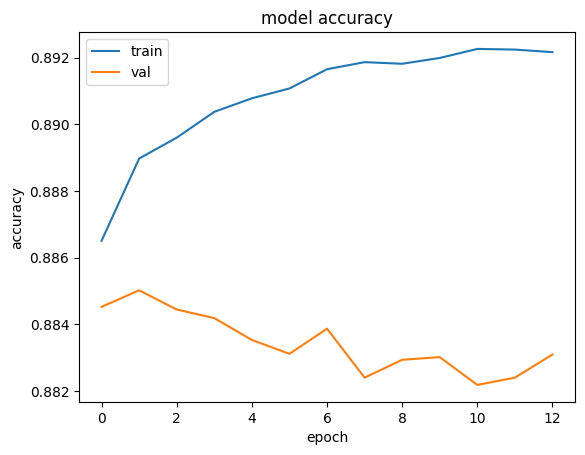

In [32]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [33]:
model.save("data/output/models/deeplearningmodels/stacked.keras")

In [35]:
tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras")

<Functional name=functional_1, built=True>

In [37]:
acc = ((tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras"
                          ).predict([X_train,probas])>.5)==y_train.values.reshape((-1,1))
      ).sum()/y_train.shape[0]
print("acc train voter",str(acc))

2026-02-09 17:24:07.807108: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 145152000 exceeds 10% of free system memory.


14175/14175 ━━━━━━━━━━━━━━━━━━━━ 63s 4ms/step
acc train voter 0.8922773368606702


In [38]:
acc = ((tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras"
                          ).predict([X_validation,val_probas])>.5)==y_validation.values.reshape((-1,1))
      ).sum()/y_validation.shape[0]
print("acc validation voter",str(acc))

1575/1575 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step
acc validation voter 0.8844444444444445


# 4. Model Selection

## On train set

In [52]:
all_predictions = [
    ('softvoter',joblib.load('data/output/models/stronglearners/softvoter.pkl').predict(X_train)),
    ('stacked',(tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_train,probas])>.5).astype(int).reshape(-1)),
    ('residual',(tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_train)>.5).astype(int).reshape(-1)),
    ('main',(tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_train)>.5).astype(int).reshape(-1))

] + [
    (est.__class__.__name__,est.predict(X_train))
     for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]


14175/14175 ━━━━━━━━━━━━━━━━━━━━ 68s 5ms/step
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 69s 5ms/step
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 66s 5ms/step


100%|██████████| 5/5 [00:33<00:00,  6.76s/it]


In [53]:
!free -m

               total        used        free      shared  buff/cache   available
Mem:            3857        3317         334           0         370         540
Swap:           2024        1043         980


In [54]:
import gc
gc.collect()

12374

In [65]:
os.makedirs('data/output/predictions',exist_ok=True)

In [66]:
(pandas.DataFrame(dict(all_predictions))+0).to_csv("data/output/predictions/train.csv",index=False)

In [111]:
# Generate test probabilities for all models
all_train_predictions_proba = [
    ('softvoter', joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_train)[:, 1]),
    ('stacked', tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_train, probas]).reshape(-1)),
    ('residual', tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_train).reshape(-1)),
    ('main', tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_train).reshape(-1))
] + [
    (est.__class__.__name__, est.predict_proba(X_train)[:, 1])
    for est
    in tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]

(pandas.DataFrame(dict(all_train_predictions_proba))).to_csv("data/output/predictions/train_probabilities.csv", index=False)

14175/14175 ━━━━━━━━━━━━━━━━━━━━ 87s 6ms/step
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 53s 4ms/step
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 50s 4ms/step


100%|██████████| 5/5 [00:44<00:00,  8.88s/it]


## Eval set

In [67]:
!free -m
import gc
gc.collect()


               total        used        free      shared  buff/cache   available
Mem:            3857        3713         118           0         183         143
Swap:           2024        1190         833


3401

In [68]:
all_val_predictions = [
    ('softvoter',joblib.load('data/output/models/stronglearners/softvoter.pkl').predict(X_validation)),
    ('stacked',(tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_validation,val_probas])>.5).astype(int).reshape(-1)),
    ('residual',(tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_validation)>.5).astype(int).reshape(-1)),
    ('main',(tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_validation)>.5).astype(int).reshape(-1))

] + [
    (est.__class__.__name__,est.predict(X_validation))
     for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]


1575/1575 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step
1575/1575 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step
1575/1575 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step


100%|██████████| 5/5 [00:06<00:00,  1.20s/it]


In [70]:
(pandas.DataFrame(dict(all_val_predictions))+0).to_csv("data/output/predictions/validation.csv",index=False)

In [110]:
# Generate test probabilities for all models
all_validation_predictions_proba = [
    ('softvoter', joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_validation)[:, 1]),
    ('stacked', tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_validation, val_probas]).reshape(-1)),
    ('residual', tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_validation).reshape(-1)),
    ('main', tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_validation).reshape(-1))
] + [
    (est.__class__.__name__, est.predict_proba(X_validation)[:, 1])
    for est
    in tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]

(pandas.DataFrame(dict(all_validation_predictions_proba))).to_csv("data/output/predictions/validation_probabilities.csv", index=False)

1575/1575 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step
1575/1575 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step
1575/1575 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step


100%|██████████| 5/5 [00:09<00:00,  1.97s/it]


## On test set

In [73]:
print(X_test.shape)
X_test = Transformer.fit_transform(X_test)
test_probas = numpy.concatenate([
    est.predict_proba(X_test)
        for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)   
] + [
    joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_test)
],axis=1)
print(X_test.shape)
print(test_probas.shape)

(126000, 13)


100%|██████████| 5/5 [00:10<00:00,  2.05s/it]


(126000, 80)
(126000, 12)


In [74]:
!free -m
import gc
gc.collect()

               total        used        free      shared  buff/cache   available
Mem:            3857        3476         199           0         346         380
Swap:           2024        1324         699


13187

In [75]:
all_test_predictions = [
    ('softvoter',joblib.load('data/output/models/stronglearners/softvoter.pkl').predict(X_test)),
    ('stacked',(tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_test,test_probas])>.5).astype(int).reshape(-1)),
    ('residual',(tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_test)>.5).astype(int).reshape(-1)),
    ('main',(tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_test)>.5).astype(int).reshape(-1))
] + [
    (est.__class__.__name__,est.predict(X_test))
        for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]
(pandas.DataFrame(dict(all_test_predictions))+0).to_csv("data/output/predictions/test.csv",index=False)

3938/3938 ━━━━━━━━━━━━━━━━━━━━ 22s 6ms/step
3938/3938 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step
3938/3938 ━━━━━━━━━━━━━━━━━━━━ 21s 5ms/step


100%|██████████| 5/5 [00:19<00:00,  3.93s/it]


In [108]:
# Generate test probabilities for all models
all_test_predictions_proba = [
    ('softvoter', joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_test)[:, 1]),
    ('stacked', tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_test, test_probas]).reshape(-1)),
    ('residual', tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_test).reshape(-1)),
    ('main', tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_test).reshape(-1))
] + [
    (est.__class__.__name__, est.predict_proba(X_test)[:, 1])
    for est
    in tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]

(pandas.DataFrame(dict(all_test_predictions_proba))).to_csv("data/output/predictions/test_probabilities.csv", index=False)

3938/3938 ━━━━━━━━━━━━━━━━━━━━ 35s 9ms/step
3938/3938 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step
3938/3938 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step


100%|██████████| 5/5 [00:11<00:00,  2.33s/it]


## Evaluations

In [114]:
all_auc_scores = pandas.DataFrame([
    (n,v, roc_auc_score(y,d[v]))
    for
    (n,d,y ) in
    [('train',pandas.read_csv("data/output/predictions/train_probabilities.csv"),y_train),
    ('validation',pandas.read_csv("data/output/predictions/validation_probabilities.csv"),y_validation),
    ('test',pandas.read_csv("data/output/predictions/test_probabilities.csv"),y_test)   ]
    for v in d
],columns=["stage","model","auc"])
all_auc_pivot = all_auc_scores.pivot(index="model",columns="stage",values="auc").sort_values("test",ascending=False)
all_auc_pivot

stage,test,train,validation
model,,,
XGBClassifier,0.954701,0.955659,0.954513
softvoter,0.954216,0.956207,0.953922
stacked,0.953408,0.956784,0.952882
main,0.952704,0.953138,0.952414
residual,0.952424,0.952758,0.952069
LogisticRegression,0.952400,0.952680,0.952042
AdaBoostClassifier,0.951567,0.952091,0.951294
RandomForestClassifier,0.950834,0.955093,0.950549
DecisionTreeClassifier,0.946317,0.953446,0.945762


In [116]:
all_auc_pivot.rank(ascending=False)

stage,test,train,validation
model,,,
XGBClassifier,1.0,3.0,1.0
softvoter,2.0,2.0,2.0
stacked,3.0,1.0,3.0
main,4.0,6.0,4.0
residual,5.0,7.0,5.0
LogisticRegression,6.0,8.0,6.0
AdaBoostClassifier,7.0,9.0,7.0
RandomForestClassifier,8.0,4.0,8.0
DecisionTreeClassifier,9.0,5.0,9.0


In [119]:
all_auc_pivot.mean(axis=1).sort_values(ascending=False)

model
XGBClassifier             0.954958
softvoter                 0.954782
stacked                   0.954358
main                      0.952752
residual                  0.952417
LogisticRegression        0.952374
RandomForestClassifier    0.952159
AdaBoostClassifier        0.951650
DecisionTreeClassifier    0.948508
dtype: float64

# 5. New Predictions

In [41]:
X_new,ix = pandas.read_csv("data/raw/test.csv",index_col=0).pipe(lambda X :

(Transformer.fit_transform(X),X.index)
)


In [42]:
X_new.shape

(270000, 80)

In [29]:
probas_new = numpy.concatenate([
    est.predict_proba(X_new)
     for est
    in
    tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)

] + [
    joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_new)
],axis=1)
probas_new.shape

100%|██████████| 5/5 [00:22<00:00,  4.49s/it]


(270000, 12)

In [35]:
# Generate test probabilities for all models
all_new_predictions_proba = [
    ('softvoter', joblib.load('data/output/models/stronglearners/softvoter.pkl').predict_proba(X_new)[:, 1]),
    ('stacked', tf.keras.models.load_model("data/output/models/deeplearningmodels/stacked.keras").predict([X_new, probas_new]).reshape(-1)),
    ('residual', tf.keras.models.load_model("data/output/models/deeplearningmodels/residual.keras").predict(X_new).reshape(-1)),
    ('main', tf.keras.models.load_model("data/output/models/deeplearningmodels/main.keras").predict(X_new).reshape(-1))
] + [
    (est.__class__.__name__, est.predict_proba(X_new)[:, 1])
    for est
    in tqdm.tqdm(joblib.load('data/output/models/stronglearners/softvoter.pkl').estimators_)
]

(pandas.DataFrame(dict(all_new_predictions_proba), index=ix)).to_csv("data/output/predictions/new_probabilities.csv")

8438/8438 ━━━━━━━━━━━━━━━━━━━━ 39s 5ms/step
8438/8438 ━━━━━━━━━━━━━━━━━━━━ 47s 6ms/step
8438/8438 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step


100%|██████████| 5/5 [00:24<00:00,  4.95s/it]


In [37]:
new_probas_df = pandas.DataFrame(dict(all_new_predictions_proba),index=ix)
new_probas_df

,softvoter,stacked,residual,main,LogisticRegression,XGBClassifier,RandomForestClassifier,DecisionTreeClassifier,AdaBoostClassifier
id,,,,,,,,,
630000,0.858714,0.947253,0.941004,0.942158,0.943347,0.938241,0.738685,0.864754,0.649490
630001,0.035758,0.006986,0.003113,0.003301,0.005075,0.006386,0.016462,0.005486,0.204121
630002,0.948294,0.991877,0.993723,0.993013,0.995128,0.992641,0.938549,0.973958,0.752499
630003,0.034588,0.007555,0.002990,0.003155,0.004573,0.003587,0.015938,0.005486,0.205357
630004,0.294340,0.213055,0.295494,0.374433,0.282165,0.201840,0.414442,0.306452,0.451804
...,...,...,...,...,...,...,...,...,...
899995,0.223126,0.203025,0.180123,0.202796,0.160701,0.166884,0.311399,0.142551,0.446582
899996,0.572852,0.605719,0.540924,0.570837,0.525081,0.612536,0.605041,0.516323,0.525908
899997,0.082771,0.050971,0.042782,0.049576,0.048637,0.027833,0.086929,0.035641,0.324689


In [38]:
for model_name in new_probas_df:
    submission = pandas.DataFrame({
        "id": new_probas_df.index,
        "Heart Disease": new_probas_df[model_name]
    })
    submission.to_csv(f"data/output/predictions/submission_{model_name}.csv", index=False)

In [30]:
pandas.read_csv("data/output/predictions/new_probabilities.csv",index_col=0).pipe(
    lambda X : pandas.DataFrame((0.95158*X["stacked"] + 0.95244*X["softvoter"] + 0.95296*X["XGBClassifier"]
                              )/(0.95158 + 0.95244 + 0.95296),columns=["Heart Disease"],index=X.index) 
                              ).to_csv("data/output/predictions/submission_ensemble.csv",index=True)

In [31]:
pandas.read_csv("data/output/predictions/new_probabilities.csv").pipe(
    lambda X : (0.95158*X["stacked"] + 0.95244*X["softvoter"] + 0.95296*X["XGBClassifier"]
                              )/(0.95158 + 0.95244 + 0.95296)
).describe()

count    270000.000000
mean          0.450950
std           0.395313
min           0.009130
25%           0.051612
50%           0.321851
75%           0.915389
max           0.993984
dtype: float64

In [43]:
bst2 = XGBClassifier()
bst2.load_model("data/output/models/xgboost/xgb2kaggle.json")
xgb_submission = pandas.DataFrame({
    "id": ix,
    "Heart Disease": bst2.predict_proba(X_new)[:,1]
})
xgb_submission.to_csv("data/output/predictions/submission_xgb2kaggle.csv", index=False)

# 6 . Kaggle Boost

## Variables Creation

### AI Litterature review


Based on the 2013 ACC/AHA guidelines I retrieved and established medical literature on cardiovascular risk assessment, here are the evidence-based categorical variables physicians create from your quantitative variables:

 **Age & Blood Pressure**
- **Age Groups** (for risk stratification):
  - <40 years (low risk group)
  - 40-49 years
  - 50-59 years  
  - 60-79 years (used in major risk models)
  - **≥80 years** (high risk threshold)

- **Blood Pressure Categories** (ACC/AHA 2013):
  - Normal: <120 mm Hg (systolic)
  - Elevated: 120-129 mm Hg
  - Stage 1 Hypertension: 130-139 mm Hg
  - Stage 2 Hypertension: ≥140 mm Hg
  - **Treated vs. Untreated BP** (important distinction in risk equations)

**Cholesterol**
- **Total Cholesterol Levels**:
  - Desirable: <200 mg/dL
  - Borderline high: 200-239 mg/dL
  - High: ≥240 mg/dL
  
- **LDL Cholesterol** (derived from total, if available):
  - Optimal: <100 mg/dL
  - Near optimal: 100-129 mg/dL
  - Borderline high: 130-159 mg/dL
  - High: 160-189 mg/dL
  - Very high: ≥190 mg/dL

**Maximum Heart Rate (Max HR)**
- **Heart Rate Response Categories**:
  - Blunted response: <85% age-predicted max HR (indicates abnormal cardiac reserve)
  - Normal response: 85-100% age-predicted max HR
  - Exaggerated response: >100% age-predicted max HR

**ST Depression**
- **ST Segment Depression Categories** (from EKG):
  - None: 0 mm
  - Minimal: 0-1 mm (borderline)
  - Mild: 1-2 mm (mild ischemia indicator)
  - Moderate: 2-3 mm (concerning)
  - Severe: >3 mm (highly abnormal, high risk)

---

**Implementation Recommendation**

For your heart disease dataset, create binary or ordinal categorical variables:
- **BP_Risk**: Normal vs. Elevated vs. Stage 1 vs. Stage 2
- **Chol_Risk**: Desirable vs. Borderline vs. High
- **ST_Abnormality**: Normal vs. Abnormal (or degree severity)
- **Age_Group**: Young/Middle-aged/Older
- **Heart_Rate_Response**: Blunted vs. Normal vs. Exaggerated

These aligns with how the Framingham Risk Score and Pooled Cohort Equations (the standard for US cardiovascular risk) categorize continuous variables for clinical decision-making.

## Consolidated Features Generator

### Modules ⚠️⚠️

In [24]:
class Binner(BaseEstimator, TransformerMixin):
    def __init__(self,column,bins={
        "BP" : ([ 120, 130, 140],['Normal', 'Elevated', 'Stage1', 'Stage2']),
        "Cholesterol" : ([200, 240], ['Desirable', 'Borderline', 'High']),
        "ST depression" : ([0.001, 1, 2, 3], ['None', 'Minimal', 'Mild', 'Moderate','Severe']),
        "Age" : ([40, 50, 60, 80], ['low risk', '40-49', '50-59', '60-79', 'high risk']),
        "Max HR" : ([0.85, 1.0], ['Blunted response', 'Normal response', 'Exaggerated response'])  }   ):     
        self.bins = bins
        self.column = column
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return numpy.digitize(X[self.column], self.bins[self.column][0]).reshape((-1,1))


In [25]:
catgroup_pipeline = Pipeline(
    [

    ('creating_groups',FeatureUnion([
    ("bp", Binner('BP')),
    ("cholesterol", Binner('Cholesterol')),
    ("stdepressopn", Binner('ST depression')),
    ("age", Binner('Age')),
    ("maxhr", Binner('Max HR'))

])),
('ordinal_encoder', OrdinalEncoder())

]
)

In [26]:
class PassData(BaseEstimator,TransformerMixin):
    def __init__(self,Method=None):
        self.Method = Method
    def fit(self,X,y=None):
        self.Method = self.Method or (lambda X : X)
        return self
    def transform(self,X):
        out = self.Method(X)
        if out.ndim == 1: out = out.reshape((-1,1))
        return out
class OnTheFlyTransformer(TransformerMixin, BaseEstimator):
    def __init__(self, transformer,path='data/output/transformers/'):
        self.path = path
        self.transformer = transformer
        self.transformer_path = self.path+self.transformer
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return joblib.load(self.transformer_path).transform(X)
class OnTheFlyEmbeddor(TransformerMixin, BaseEstimator):
    def __init__(self, embeddor,path='data/output/embeddors/'):
        self.path = path
        self.embeddor = embeddor
        self.embeddor_path = self.path+self.embeddor
    def fit(self, X, y=None):
        return self
    def transform(self, X): return joblib.load(self.embeddor_path).predict_proba(X)

class FeaturesGenerator(BaseEstimator, TransformerMixin):
    def __init__(self,
                soft_voter_path='data/output/models/stronglearners/softvoter.pkl',
                stacked_model_path = "data/output/models/deeplearningmodels/stacked.keras"):
        self.soft_voter_path = soft_voter_path
        self.stacked_model_path = stacked_model_path
        self.catgroup_pipeline = Pipeline([
            ('creating_groups',FeatureUnion([
                ("bp", Binner('BP')),
                ("cholesterol", Binner('Cholesterol')),
                ("stdepressopn", Binner('ST depression')),
                ("age", Binner('Age')),
                ("maxhr", Binner('Max HR'))
                ])),
                ('ordinal_encoder', OrdinalEncoder())])
    def get_learners_probas(self,X):
        return numpy.concatenate(

            [est.predict_proba(X)
            for est
            in
            tqdm.tqdm(joblib.load(self.soft_voter_path).estimators_)
        ] + [
            joblib.load(self.soft_voter_path).predict_proba(X)
        ],axis=1)
    def get_best_probas(self,X) :
        bst2 = XGBClassifier()
        bst2.load_model("data/output/models/xgboost/xgb2kaggle.json")
        return pandas.DataFrame(dict([
            ('softvoter', joblib.load(self.soft_voter_path).predict_proba(X)[:, 1]),
            ('xgb2kaggle', bst2.predict_proba(X)[:, 1]),
            ('stacked', tf.keras.models.load_model(self.stacked_model_path).predict(
                [X,self.get_learners_probas(X)]).reshape(-1))
                ] + [
            (est.__class__.__name__, est.predict_proba(X)[:, 1])
            for est
            in tqdm.tqdm(joblib.load(self.soft_voter_path).estimators_)
            if est.__class__.__name__  =='XGBClassifier'
            ])).assign(
            weighted_pred=lambda df : (0.95158*df["stacked"] + 0.95244*df["softvoter"] + 0.95296*df["XGBClassifier"])/(0.95158 + 0.95244 + 0.95296)
        )
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X_normal = Transformer.fit_transform(X)
        X_catgroups = self.catgroup_pipeline.fit_transform(X)
        X_best_probas = self.get_best_probas(X_normal)
        return numpy.concatenate([X_normal,X_catgroups,X_best_probas],axis=1)   

### Train,Test ⚠️⚠️

In [27]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop("Heart Disease",axis=1), 
    data["Heart Disease"]=="Presence", 
    stratify=data["Thallium"],
    test_size=0.2, 
    random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((504000, 13), (126000, 13), (504000,), (126000,))

### Validation ⚠️

## New Models

In [27]:
X_train, X_validation, y_train, y_validation = train_test_split(
    FeaturesGenerator().fit_transform(X_train), 
    y_train,
    test_size=0.1, 
    random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

2026-02-10 21:44:29.317748: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
100%|██████████| 5/5 [00:39<00:00,  7.85s/it]
2026-02-10 21:45:52.876871: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 161280000 exceeds 10% of free system memory.
2026-02-10 21:45:53.219728: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 24192000 exceeds 10% of free system memory.


15750/15750 ━━━━━━━━━━━━━━━━━━━━ 76s 5ms/step


100%|██████████| 5/5 [00:00<00:00, 10.84it/s]


((453600, 90), (50400, 90), (453600,), (50400,))

#### Xgboost kaggle

In [29]:
bst = XGBClassifier(
    **{
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "learning_rate": 0.01,
    "max_depth": 2,
    "subsample": 0.9,
    "colsample_bytree": 0.9,
    "n_estimators": 20_000,
    "min_child_weight": 1,
    "gamma": 0,
    "lambda": 0.002,
    "alpha": 1.5,
    "n_jobs": -1,
    "random_state": 42,
    'early_stopping_rounds': 300,
    'enable_categorical': True,
}
)
# fit model
bst.fit(X_train, y_train,eval_set=[(X_validation, y_validation)])
#0.95486

[0]	validation_0-auc:0.93471
[1]	validation_0-auc:0.93534
[2]	validation_0-auc:0.93684
[3]	validation_0-auc:0.93684
[4]	validation_0-auc:0.93770
[5]	validation_0-auc:0.93769
[6]	validation_0-auc:0.93770
[7]	validation_0-auc:0.93963
[8]	validation_0-auc:0.93968
[9]	validation_0-auc:0.93978
[10]	validation_0-auc:0.93987
[11]	validation_0-auc:0.94084
[12]	validation_0-auc:0.94084
[13]	validation_0-auc:0.94085
[14]	validation_0-auc:0.94084
[15]	validation_0-auc:0.94084
[16]	validation_0-auc:0.94092
[17]	validation_0-auc:0.94179
[18]	validation_0-auc:0.94180
[19]	validation_0-auc:0.94179
[20]	validation_0-auc:0.94190
[21]	validation_0-auc:0.94196
[22]	validation_0-auc:0.94196
[23]	validation_0-auc:0.94350
[24]	validation_0-auc:0.94381
[25]	validation_0-auc:0.94382
[26]	validation_0-auc:0.94391
[27]	validation_0-auc:0.94391
[28]	validation_0-auc:0.94391
[29]	validation_0-auc:0.94391
[30]	validation_0-auc:0.94392
[31]	validation_0-auc:0.94416
[32]	validation_0-auc:0.94415
[33]	validation_0-au

,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'binary:logistic'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.9
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",300
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,True
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes fro

In [30]:
acc = (bst.predict(X_train)==y_train).sum()/y_train.shape[0]
print("acc train voter",str(acc))

acc train voter 0.8925330687830688


In [31]:
acc = (bst.predict(X_validation)==y_validation).sum()/y_validation.shape[0]
print("acc validation voter",str(acc))

acc validation voter 0.8850793650793651


In [ ]:
#os.makedirs('data/output/models/xgboost/',exist_ok=True)

In [32]:
bst.save_model('data/output/models/xgboost/bstkaggle.json')

#### Soft voter

In [33]:
!free -m
import gc
gc.collect()

               total        used        free      shared  buff/cache   available
Mem:            3857        3699          62           2         264         157
Swap:           2024        1039         984


2780

In [34]:
voter = VotingClassifier(
    estimators=[
            ('lr',LogisticRegression(random_state=42,max_iter=10000)),
            ('xgb',XGBClassifier(**{'objective': 'binary:logistic','base_score': None,'booster': None,'colsample_bylevel': None,'colsample_bynode': None,'colsample_bytree': None,'device': None,'eval_metric': None,'gamma': None,'grow_policy': None,'interaction_constraints': None,'learning_rate': 1,'max_bin': None,'max_cat_threshold': None,'max_cat_to_onehot': None,'max_delta_step': None,'max_depth': 2,'max_leaves': None,'min_child_weight': None,'monotone_constraints': None,'multi_strategy': None,'n_jobs': -1,'num_parallel_tree': None,'random_state': None,'reg_alpha': None,'reg_lambda': None,'sampling_method': None,'scale_pos_weight': None,'subsample': None,'tree_method': None,'validate_parameters': None,'verbosity': None})),
            ('rf1',RandomForestClassifier(n_estimators=1000,max_depth=10, random_state=42,n_jobs=-1)),
            ('dt', DecisionTreeClassifier(max_depth=10,random_state=42)),
            ('ada',AdaBoostClassifier(
                    DecisionTreeClassifier(max_depth=1),
                    n_estimators=100,
                    learning_rate=.5,
                    random_state=42
                    
                    
                ))
        ]
    ,
    voting='soft',
    weights=[1,3,1,1,1]
)
voter.fit(X_train, y_train)

,"estimators estimators: list of (str, estimator) tuplesInvoking the ``fit`` method on the ``VotingClassifier`` will fit clonesof those original estimators that will be stored in the class attribute``self.estimators_``. An estimator can be set to ``'drop'`` using:meth:`set_params`... versionchanged:: 0.21 ``'drop'`` is accepted. Using None was deprecated in 0.22 and support was removed in 0.24.","[('lr', ...), ('xgb', ...), ...]"
,"voting voting: {'hard', 'soft'}, default='hard'If 'hard', uses predicted class labels for majority rule voting.Else if 'soft', predicts the class label based on the argmax ofthe sums of the predicted probabilities, which is recommended foran ensemble of well-calibrated classifiers.",'soft'
,"weights weights: array-like of shape (n_classifiers,), default=NoneSequence of weights (`float` or `int`) to weight the occurrences ofpredicted class labels (`hard` voting) or class probabilitiesbefore averaging (`soft` voting). Uses uniform weights if `None`.","[1, 3, ...]"
,"n_jobs n_jobs: int, default=NoneThe number of jobs to run in parallel for ``fit``.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionadded:: 0.18",None
,"flatten_transform flatten_transform: bool, default=TrueAffects shape of transform output only when voting='soft'If voting='soft' and flatten_transform=True, transform method returnsmatrix with shape (n_samples, n_classifiers * n_classes). Ifflatten_transform=False, it returns(n_classifiers, n_samples, n_classes).",True
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting will be printed as itis completed... versionadded:: 0.23",False
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001


In [35]:
joblib.dump(voter,'data/output/models/stronglearners/softvoterkaggle.pkl')

['data/output/models/stronglearners/softvoterkaggle.pkl']

In [36]:
!free -m
import gc
gc.collect()

               total        used        free      shared  buff/cache   available
Mem:            3857        3554         162           2         311         303
Swap:           2024        1213         810


0

In [37]:
#with sklearn.config_context(working_memory=)
acc = (joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict(X_train)==y_train).sum()/y_train.shape[0]
print("acc train voter",str(acc))
acc = (joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict(X_validation)==y_validation).sum()/y_validation.shape[0]
print("acc validation voter",str(acc))

acc train voter 0.8947354497354497
acc validation voter 0.8851587301587301


#### Stacked model

In [38]:
bst = XGBClassifier()
bst.load_model('data/output/models/xgboost/bstkaggle.json')

In [39]:
probas = numpy.concatenate([

    joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict_proba(X_train),
    bst.predict_proba(X_train)

],axis=1)

In [40]:
probas_val = numpy.concatenate([
    joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict_proba(X_validation),
    bst.predict_proba(X_validation)

],axis=1)

In [41]:
inputs = Input(shape=(X_train.shape[1],))
predictions = Input(shape=(probas.shape[1],))

# Première couche
x1 = Dense(300, activation='relu')(inputs)
x1 = Dropout(0.5)(x1) # 30% des neurones désactivés

# Deuxième couche
x2 = Dense(200, activation='relu')(x1)
x2 = Dropout(0.5)(x2) # 30% des neurones désactivés

# Deuxième couche
x3 = Dense(500, activation='relu')(x2)
x3 = Dropout(0.6)(x3) # 30% des neurones désactivés


# Réinjection de l'input original dans la 3ème couche
concat = Concatenate()([x3, inputs,predictions])
x4 = Dense(10, activation='relu')(concat)
x4 = Dropout(0.2)(x4)
# Dernière couche avec sigmoid
outputs = Dense(1, activation='sigmoid')(x4)

# Création du modèle
model = Model(inputs=[inputs, predictions], outputs=outputs)

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.AUC()]
)

# Display model architecture
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 90)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 300)       │     27,300 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 300)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 200)       │     60,200 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 200)       │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 500)       │    100,500 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 500)       │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 4)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 594)       │          0 │ dropout_2[0][0],  │
│ (Concatenate)       │                   │            │ input_layer[0][0… │
│                     │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 10)        │      5,950 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 10)        │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 1)         │         11 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 193,961 (757.66 KB)

 Trainable params: 193,961 (757.66 KB)

 Non-trainable params: 0 (0.00 B)

In [42]:

early_stop = EarlyStopping(
    monitor='val_auc',
    mode='max',
    patience=10,
    restore_best_weights=True
)

# Train the model with both inputs
history = model.fit(
    [X_train, probas], 
    y_train,
    validation_data=([X_validation, probas_val], y_validation),
    epochs=100,
    batch_size=32,
    callbacks=[early_stop],
    
    verbose=1
)


2026-02-10 22:46:53.412467: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 163296000 exceeds 10% of free system memory.


Epoch 1/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 157s 11ms/step - accuracy: 0.8882 - auc: 0.9493 - loss: 0.2853 - val_accuracy: 0.8863 - val_auc: 0.9533 - val_loss: 0.2740
Epoch 2/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 132s 9ms/step - accuracy: 0.8912 - auc: 0.9523 - loss: 0.2768 - val_accuracy: 0.8852 - val_auc: 0.9534 - val_loss: 0.2749
Epoch 3/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 129s 9ms/step - accuracy: 0.8916 - auc: 0.9529 - loss: 0.2750 - val_accuracy: 0.8846 - val_auc: 0.9535 - val_loss: 0.2750
Epoch 4/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 128s 9ms/step - accuracy: 0.8924 - auc: 0.9534 - loss: 0.2737 - val_accuracy: 0.8850 - val_auc: 0.9527 - val_loss: 0.2763
Epoch 5/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 168s 12ms/step - accuracy: 0.8928 - auc: 0.9537 - loss: 0.2727 - val_accuracy: 0.8849 - val_auc: 0.9531 - val_loss: 0.2761
Epoch 6/100
14175/14175 ━━━━━━━━━━━━━━━━━━━━ 200s 14ms/step - accuracy: 0.8931 - auc: 0.9541 - loss: 0.2717 - val_accuracy: 0.8844 - val_auc: 0.9531 - val_loss: 0.

In [43]:
model.save("data/output/models/deeplearningmodels/stackedkaggle.keras")

In [ ]:
#model.save("data/output/models/deeplearningmodels/stackedkaggleauc.keras")

### Evaluation

In [44]:
X_test = FeaturesGenerator().fit_transform(X_test)
bst = XGBClassifier()
bst.load_model('data/output/models/xgboost/bstkaggle.json')
probas_test = numpy.concatenate([
    joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict_proba(X_test),
    bst.predict_proba(X_test)

],axis=1)
auc_scores = [
    ('softvote', roc_auc_score(y_test, joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict_proba(X_test)[:, 1])),
    ('xgboost', roc_auc_score(y_test, bst.predict_proba(X_test)[:, 1])),
    ('stacked', roc_auc_score(y_test, tf.keras.models.load_model("data/output/models/deeplearningmodels/stackedkaggle.keras").predict([X_test, probas_test]).reshape(-1)))
]
print("AUC scores:", auc_scores)

100%|██████████| 5/5 [00:09<00:00,  1.92s/it]


3938/3938 ━━━━━━━━━━━━━━━━━━━━ 27s 7ms/step


100%|██████████| 5/5 [00:00<00:00, 26.78it/s]


3938/3938 ━━━━━━━━━━━━━━━━━━━━ 25s 6ms/step
AUC scores: [('softvote', 0.9539886834452659), ('xgboost', 0.9544182100977675), ('stacked', 0.9539029133403147)]


In [45]:
dict( [('softvote', 0.9539886834452659), ('xgboost', 0.9544182100977675), ('stacked', 0.9539029133403147)])

{'softvote': 0.9539886834452659,
 'xgboost': 0.9544182100977675,
 'stacked': 0.9539029133403147}

## New submissions

In [ ]:
X_new,ix = pandas.read_csv("data/raw/test.csv",index_col=0).pipe(lambda X : (FeaturesGenerator().fit_transform(X),X.index))
bst = XGBClassifier()
bst.load_model('data/output/models/xgboost/bstkaggle.json')
probas_new = numpy.concatenate([
    joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict_proba(X_new),
    bst.predict_proba(X_new)
],axis=1)
pandas.DataFrame({
    "id": ix,
    "Heart Disease": tf.keras.models.load_model("data/output/models/deeplearningmodels/stackedkaggle.keras").predict([X_new, probas_new]).reshape(-1)
}).to_csv("data/output/predictions/submission_stackedkaggle.csv", index=False)
pandas.DataFrame({
    "id": ix,
    "Heart Disease": bst.predict_proba(X_new)[:, 1]
}).to_csv("data/output/predictions/submission_xgboostkaggle.csv", index=False)
pandas.DataFrame({
    "id": ix,
    "Heart Disease": joblib.load('data/output/models/stronglearners/softvoterkaggle.pkl').predict_proba(X_new)[:, 1]
}).to_csv("data/output/predictions/submission_softvoterkaggle.csv", index=False)


# 7. Blending Predictions

In [58]:
pandas.DataFrame(
        
        
        ((
    
            pandas.read_csv("data/output/predictions/submission_XGBClassifier.csv"
                           )['Heart Disease']+pandas.read_csv(
    "data/output/predictions/submission_xgb2kaggle.csv"

)['Heart Disease']
        )/2).values,
        
        
        columns=["Heart Disease"],
    
    index=pandas.read_csv("data/output/predictions/submission_XGBClassifier.csv"
                           )['id']).to_csv("data/output/predictions/submission_simple_mean.csv",index=True)

In [59]:
pandas.DataFrame(
        
        
        ((
    
            pandas.read_csv("data/output/predictions/submission_XGBClassifier.csv"
                           )['Heart Disease']+0.95331*pandas.read_csv(
    "data/output/predictions/submission_xgb2kaggle.csv"

)['Heart Disease']*0.95296
        )/(0.95331+0.95296)).values,
        
        
        columns=["Heart Disease"],
    
    index=pandas.read_csv("data/output/predictions/submission_XGBClassifier.csv"
                           )['id']).to_csv("data/output/predictions/submission_pond_mean.csv",index=True)

In [61]:
def percentile(x):
    return numpy.percentile(x, 25)

In [81]:
sub_1 = pandas.read_csv('data/output/predictions/submission_XGBClassifier.csv')
sub_2 = pandas.read_csv('data/output/predictions/submission_xgb2kaggle.csv')
#sub_3 = pandas.read_csv('data/output/predictions/submission_ensemble.csv')
#sub_4 = pandas.read_csv('data/output/predictions/submission_xgb2kaggle.csv')

In [82]:
df = pandas.concat([sub_1.iloc[:, 1], sub_2.iloc[:, 1],
           #sub_3.iloc[:, 1], 
            #    sub_4.iloc[:, 1],
            #   sub_5.iloc[:, 1]
               ], axis=1)

In [91]:
sam = pandas.read_csv('data/raw/sample_submission.csv')
# sam.iloc[:, -1] = (0.6*sub_1.iloc[:, -1] + 0.4*sub_2.iloc[:, -1])
# sam.iloc[:, -1] = df.median(axis=1)
# sam.iloc[:, -1] = final_pred

sam['Heart Disease'] = (0.2*sub_1.iloc[:, -1] + 0.8*sub_2.iloc[:, -1]) #df.apply(percentile, axis=1)
sam

,id,Heart Disease
0,630000,0.942176
1,630001,0.006568
2,630002,0.990150
3,630003,0.004321
4,630004,0.208404
...,...,...
269995,899995,0.183975
269996,899996,0.645527
269997,899997,0.046988
269998,899998,0.189643


In [92]:
sam.to_csv("data/output/predictions/submission_mean5.csv",index=False)

# 8. Feature interactions, Target Encoding, Xgboost hyperparameter optimization, Other boosting methods, Weak features' removal

## Feature Engineering ⚠️⚠️

### Feature interactions
✅ PolynomialFeature class from scikit-learn already provides feature interaction


```python
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
X = np.arange(6).reshape(3, 2)
X
array([[0, 1],
       [2, 3],
       [4, 5]])
poly = PolynomialFeatures(2)
poly.fit_transform(X)
array([[ 1.,  0.,  1.,  0.,  0.,  1.],
       [ 1.,  2.,  3.,  4.,  6.,  9.],
       [ 1.,  4.,  5., 16., 20., 25.]])
poly = PolynomialFeatures(interaction_only=True)
poly.fit_transform(X)
array([[ 1.,  0.,  1.,  0.],
       [ 1.,  2.,  3.,  6.],
       [ 1.,  4.,  5., 20.]])
```

### Target Encoding 

In [28]:
targetEncoder = Pipeline(
            [
            ('tenc', TargetEncoder()),
            ("std",StandardScaler())
            ])
#targetEncoder.fit(data[qualitative_variables+ordered_qualitative_variables],data["Heart Disease"]=="Presence")
#joblib.dump(targetEncoder,'data/output/transformers/targetEncoder.pkl')

### Features Ratio

In [29]:
def ComputeRatios(X, eps=1e-6):
     return numpy.concatenate(
          [
              (X['Max HR'] / (220 - X['Age'] + eps)).values.reshape((-1,1)),
              (X['BP'] / (X['Age'] + eps)).values.reshape((-1,1)),
              (X['Cholesterol'] / (X['Age'] + eps)).values.reshape((-1,1)),
              (X['Cholesterol'] / (X['BP'] + eps)).values.reshape((-1,1)),
              (X['Cholesterol'] / (X['Number of vessels fluro'] + 1.0)).values.reshape((-1,1)),
              (X['ST depression'] / (X['Max HR'] + eps)).values.reshape((-1,1)),
              (X['ST depression'] / (X['BP'] + eps)).values.reshape((-1,1)),
              (X['ST depression'] / (X['Slope of ST'] + 0.1)).values.reshape((-1,1)),
              (X['Number of vessels fluro'] / (X['Age'] + eps)).values.reshape((-1,1)),
              (X['Thallium'] / (X['Number of vessels fluro'] + 1.0)).values.reshape((-1,1)),
              ((220 - X['Age'] + eps - X['Max HR']) / (220 - X['Age'] + eps)).values.reshape((-1,1)),
              (X['BP'] * X['Cholesterol']).values.reshape((-1,1)),
               numpy.log(X['Cholesterol'].astype(float) + 1.0).values.reshape((-1,1)),
              numpy.log(X['ST depression'].abs().astype(float) + 1.0).values.reshape((-1,1)),
             (X['Cholesterol'] / (X['BP'] + eps) > 1.5).astype(int).values.reshape((-1,1)),
              (X['Max HR'] / (220 - X['Age'] + eps) < 0.7).astype(int).values.reshape((-1,1))
          ],axis=1
     )

In [30]:
#pandas.DataFrame(ComputeRatios(data)).info()

In [31]:
class FeaturesGenerator2(FeaturesGenerator):
    def transform(self, X,all_qualitative_variables=qualitative_variables+ordered_qualitative_variables):
        self.all_qualitative_variables = all_qualitative_variables
        X_normal = Transformer.fit_transform(X)
        X_catgroups = self.catgroup_pipeline.fit_transform(X)
        X_target_encoded = joblib.load('data/output/transformers/targetEncoder.pkl').transform(X[self.all_qualitative_variables ])
        ratios = ComputeRatios(X)
        return numpy.concatenate([X_normal,X_catgroups,X_target_encoded,ratios],axis=1)[:,[False, False,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False,  True,  True,  True,  True, False,
       False, False,  True,  True,  True, False,  True,  True,  True,
        True, False, False, False, False, False, False, False, False,
       False,  True, False, False, False,  True,  True,  True,  True,
        True, False,  True, False, False, False, False,  True,  True,
       False, False,  True, False, False, False, False, False, False,
       False]   ]

## Validation Data ⚠️

In [32]:
X_train, X_validation, y_train, y_validation = train_test_split(
    FeaturesGenerator2().fit_transform(X_train), 
    y_train,
    test_size=0.1, 
    random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

((453600, 27), (50400, 27), (453600,), (50400,))

## Xgboost with target encoding

Text(0.5, 1.0, 'Feature Importances')

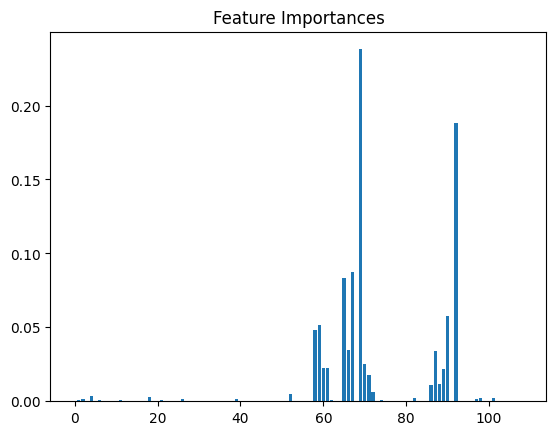

In [ ]:
#plt.bar(range(len(bst.feature_importances_)), bst.feature_importances_)
#plt.title("Feature Importances")

In [ ]:
bst = XGBClassifier(**{
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "learning_rate": 0.01,
    "max_depth": 2,
    "subsample": 0.9,
    "colsample_bytree": 0.9,
    "n_estimators": 20_000,
    "min_child_weight": 1,
    "gamma": 0,
    "lambda": 0.002,
    "alpha": 1.5,
    "n_jobs": -1,
    "random_state": 42,
    'early_stopping_rounds': 300,
    'enable_categorical': True,
})
# fit model
bst.fit(X_train, y_train,
                    eval_set=[(X_validation, y_validation)])
#95486

[0]	validation_0-auc:0.88169
[1]	validation_0-auc:0.88169
[2]	validation_0-auc:0.88169
[3]	validation_0-auc:0.88169
[4]	validation_0-auc:0.88169
[5]	validation_0-auc:0.88169
[6]	validation_0-auc:0.88169
[7]	validation_0-auc:0.88169
[8]	validation_0-auc:0.88169
[9]	validation_0-auc:0.88169
[10]	validation_0-auc:0.88169
[11]	validation_0-auc:0.88169
[12]	validation_0-auc:0.88169
[13]	validation_0-auc:0.88169
[14]	validation_0-auc:0.88825
[15]	validation_0-auc:0.88825
[16]	validation_0-auc:0.88825
[17]	validation_0-auc:0.88825
[18]	validation_0-auc:0.88825
[19]	validation_0-auc:0.88832
[20]	validation_0-auc:0.90419
[21]	validation_0-auc:0.90429
[22]	validation_0-auc:0.90430
[23]	validation_0-auc:0.90430
[24]	validation_0-auc:0.90430
[25]	validation_0-auc:0.90430
[26]	validation_0-auc:0.90430
[27]	validation_0-auc:0.90430
[28]	validation_0-auc:0.90479
[29]	validation_0-auc:0.90479
[30]	validation_0-auc:0.90479
[31]	validation_0-auc:0.90967
[32]	validation_0-auc:0.90967
[33]	validation_0-au

,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'binary:logistic'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.9
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",300
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,True
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes fro

In [81]:
bst.save_model('data/output/models/xgboost/ratios.json')

## Optuna

In [35]:
def objective(trial):
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_validation, label=y_validation)

    param = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0,log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0,log=True),
    }

    if param["booster"] == "gbtree" or param["booster"] == "dart":
        param["max_depth"] = trial.suggest_int("max_depth", 1, 9)
        param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
        param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
        param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)
    global preds
    # Add a callback for pruning.
    pruning_callback = optuna.integration.XGBoostPruningCallback(trial, "validation-auc")
    bst = xgb.train(param, dtrain, evals=[(dtest, "validation")], callbacks=[pruning_callback])
    bst.save_model('data/output/models/xgboost/optuna.json')
    preds = bst.predict(dtest)
    auc = roc_auc_score(y_validation, preds)
    return auc

In [36]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100, timeout=600)

[I 2026-02-12 09:33:03,687] A new study created in memory with name: no-name-869d02c8-02cc-4a53-840d-74c702cb1fff


[0]	validation-auc:0.92133
[1]	validation-auc:0.92133
[2]	validation-auc:0.92133
[3]	validation-auc:0.92133
[4]	validation-auc:0.92133
[5]	validation-auc:0.92133
[6]	validation-auc:0.92133
[7]	validation-auc:0.92133
[8]	validation-auc:0.92133
[9]	validation-auc:0.92133


[I 2026-02-12 09:33:05,904] Trial 0 finished with value: 0.9213319697524986 and parameters: {'booster': 'dart', 'lambda': 0.014118296635897374, 'alpha': 0.000338245870990305, 'max_depth': 4, 'eta': 2.215100681014546e-05, 'gamma': 0.1615534458805114, 'grow_policy': 'depthwise', 'sample_type': 'weighted', 'normalize_type': 'forest', 'rate_drop': 0.00024282380505954602, 'skip_drop': 1.007145620321267e-06}. Best is trial 0 with value: 0.9213319697524986.


[0]	validation-auc:0.90621
[1]	validation-auc:0.90621
[2]	validation-auc:0.90621
[3]	validation-auc:0.90621
[4]	validation-auc:0.90621
[5]	validation-auc:0.90621
[6]	validation-auc:0.90621
[7]	validation-auc:0.90621
[8]	validation-auc:0.90621
[9]	validation-auc:0.90621


[I 2026-02-12 09:33:07,931] Trial 1 finished with value: 0.9062141111692651 and parameters: {'booster': 'gbtree', 'lambda': 0.00031242155842361405, 'alpha': 6.251074610520685e-06, 'max_depth': 3, 'eta': 3.890388899197874e-05, 'gamma': 2.150723076927969e-06, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 0.9213319697524986.


[0]	validation-auc:0.94332
[1]	validation-auc:0.94824
[2]	validation-auc:0.95030
[3]	validation-auc:0.95101
[4]	validation-auc:0.95130
[5]	validation-auc:0.95143
[6]	validation-auc:0.95151
[7]	validation-auc:0.95155
[8]	validation-auc:0.95159
[9]	validation-auc:0.95161


[I 2026-02-12 09:33:09,276] Trial 2 finished with value: 0.951613926669657 and parameters: {'booster': 'gblinear', 'lambda': 4.273237906400493e-05, 'alpha': 0.0019042055948666323}. Best is trial 2 with value: 0.951613926669657.


[0]	validation-auc:0.94128
[1]	validation-auc:0.94772
[2]	validation-auc:0.95033
[3]	validation-auc:0.95098
[4]	validation-auc:0.95107
[5]	validation-auc:0.95101
[6]	validation-auc:0.95099
[7]	validation-auc:0.95096
[8]	validation-auc:0.95093
[9]	validation-auc:0.95091


[I 2026-02-12 09:33:10,812] Trial 3 finished with value: 0.9509102735800969 and parameters: {'booster': 'gblinear', 'lambda': 3.072599078935692e-08, 'alpha': 0.013770710472228307}. Best is trial 2 with value: 0.951613926669657.


[0]	validation-auc:0.93759
[1]	validation-auc:0.94593
[2]	validation-auc:0.94810
[3]	validation-auc:0.94995
[4]	validation-auc:0.95085
[5]	validation-auc:0.95136
[6]	validation-auc:0.95162
[7]	validation-auc:0.95176
[8]	validation-auc:0.95185
[9]	validation-auc:0.95200


[I 2026-02-12 09:33:12,658] Trial 4 finished with value: 0.9519964605122294 and parameters: {'booster': 'gbtree', 'lambda': 0.005699847510939196, 'alpha': 3.171131034993919e-07, 'max_depth': 6, 'eta': 0.7183715157708878, 'gamma': 0.00104113118296397, 'grow_policy': 'depthwise'}. Best is trial 4 with value: 0.9519964605122294.
[I 2026-02-12 09:33:14,045] Trial 5 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94140


[I 2026-02-12 09:33:14,993] Trial 6 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94199


[I 2026-02-12 09:33:16,084] Trial 7 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:33:16,922] Trial 8 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94358
[1]	validation-auc:0.94818
[2]	validation-auc:0.95026
[3]	validation-auc:0.95097
[4]	validation-auc:0.95124
[5]	validation-auc:0.95139
[6]	validation-auc:0.95147
[7]	validation-auc:0.95153
[8]	validation-auc:0.95157
[9]	validation-auc:0.95159


[I 2026-02-12 09:33:18,079] Trial 9 finished with value: 0.9515931615116222 and parameters: {'booster': 'gblinear', 'lambda': 4.58829041530424e-07, 'alpha': 0.00029469095188427915}. Best is trial 4 with value: 0.9519964605122294.


[0]	validation-auc:0.94753
[1]	validation-auc:0.94973
[2]	validation-auc:0.95050
[3]	validation-auc:0.95079
[4]	validation-auc:0.95104
[5]	validation-auc:0.95121
[6]	validation-auc:0.95133
[7]	validation-auc:0.95131
[8]	validation-auc:0.95124
[9]	validation-auc:0.95120


[I 2026-02-12 09:33:20,580] Trial 10 finished with value: 0.9511993873086885 and parameters: {'booster': 'gbtree', 'lambda': 0.5334719113774644, 'alpha': 5.763744182303463e-07, 'max_depth': 9, 'eta': 0.744621646683722, 'gamma': 0.0003358472794621792, 'grow_policy': 'depthwise'}. Best is trial 4 with value: 0.9519964605122294.
[I 2026-02-12 09:33:21,339] Trial 11 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94906
[2]	validation-auc:0.95045
[3]	validation-auc:0.95101
[4]	validation-auc:0.95146
[5]	validation-auc:0.95163
[6]	validation-auc:0.95167
[7]	validation-auc:0.95174
[8]	validation-auc:0.95184
[9]	validation-auc:0.95210


[I 2026-02-12 09:33:22,933] Trial 12 finished with value: 0.9521041212301401 and parameters: {'booster': 'gbtree', 'lambda': 0.0001500461613445584, 'alpha': 3.160177138329383e-08, 'max_depth': 8, 'eta': 0.6639964685141122, 'gamma': 8.439137993864775e-06, 'grow_policy': 'lossguide'}. Best is trial 12 with value: 0.9521041212301401.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94896
[2]	validation-auc:0.95054
[3]	validation-auc:0.95104
[4]	validation-auc:0.95156
[5]	validation-auc:0.95177
[6]	validation-auc:0.95195
[7]	validation-auc:0.95211
[8]	validation-auc:0.95214
[9]	validation-auc:0.95207


[I 2026-02-12 09:33:24,572] Trial 13 finished with value: 0.9520742302980655 and parameters: {'booster': 'gbtree', 'lambda': 0.0019340541096231568, 'alpha': 1.5775080516987836e-08, 'max_depth': 8, 'eta': 0.5942392355241845, 'gamma': 1.0336595286928533e-05, 'grow_policy': 'lossguide'}. Best is trial 12 with value: 0.9521041212301401.


[0]	validation-auc:0.94731


[I 2026-02-12 09:33:25,500] Trial 14 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94556


[I 2026-02-12 09:33:26,520] Trial 15 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:33:27,403] Trial 16 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:28,460] Trial 17 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:29,993] Trial 18 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:30,892] Trial 19 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556


[I 2026-02-12 09:33:31,751] Trial 20 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:33:32,939] Trial 21 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:33,702] Trial 22 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:34,603] Trial 23 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94731


[I 2026-02-12 09:33:36,570] Trial 24 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:33:37,840] Trial 25 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556


[I 2026-02-12 09:33:41,286] Trial 26 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:33:43,140] Trial 27 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:44,555] Trial 28 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94383
[1]	validation-auc:0.94827
[2]	validation-auc:0.95033
[3]	validation-auc:0.95109
[4]	validation-auc:0.95137
[5]	validation-auc:0.95148
[6]	validation-auc:0.95152
[7]	validation-auc:0.95154


[I 2026-02-12 09:33:45,663] Trial 29 pruned. Trial was pruned at iteration 8.
[I 2026-02-12 09:33:47,295] Trial 30 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:47,811] Trial 31 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:33:48,589] Trial 32 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94463
[1]	validation-auc:0.94823


[I 2026-02-12 09:33:49,903] Trial 33 pruned. Trial was pruned at iteration 2.
[I 2026-02-12 09:33:51,109] Trial 34 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94337
[1]	validation-auc:0.94823


[I 2026-02-12 09:33:52,747] Trial 35 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94516
[1]	validation-auc:0.94864
[2]	validation-auc:0.95031
[3]	validation-auc:0.95098
[4]	validation-auc:0.95124
[5]	validation-auc:0.95138


[I 2026-02-12 09:33:54,839] Trial 36 pruned. Trial was pruned at iteration 6.


[0]	validation-auc:0.94534


[I 2026-02-12 09:33:56,314] Trial 37 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94895


[I 2026-02-12 09:33:58,566] Trial 38 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94386
[1]	validation-auc:0.94835


[I 2026-02-12 09:33:59,108] Trial 39 pruned. Trial was pruned at iteration 2.
[I 2026-02-12 09:34:00,225] Trial 40 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94373


[I 2026-02-12 09:34:01,204] Trial 41 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:01,951] Trial 42 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94340


[I 2026-02-12 09:34:03,042] Trial 43 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:03,622] Trial 44 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:05,104] Trial 45 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:06,031] Trial 46 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:06,923] Trial 47 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94368
[1]	validation-auc:0.94819
[2]	validation-auc:0.95034
[3]	validation-auc:0.95108
[4]	validation-auc:0.95135
[5]	validation-auc:0.95149
[6]	validation-auc:0.95155
[7]	validation-auc:0.95157
[8]	validation-auc:0.95158


[I 2026-02-12 09:34:08,651] Trial 48 pruned. Trial was pruned at iteration 9.
[I 2026-02-12 09:34:09,401] Trial 49 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:10,523] Trial 50 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94754
[1]	validation-auc:0.94956
[2]	validation-auc:0.95066


[I 2026-02-12 09:34:12,239] Trial 51 pruned. Trial was pruned at iteration 3.


[0]	validation-auc:0.94744
[1]	validation-auc:0.94973


[I 2026-02-12 09:34:13,583] Trial 52 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94554


[I 2026-02-12 09:34:14,885] Trial 53 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:15,673] Trial 54 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94731


[I 2026-02-12 09:34:16,580] Trial 55 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94556


[I 2026-02-12 09:34:18,118] Trial 56 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:19,272] Trial 57 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94975
[2]	validation-auc:0.95044
[3]	validation-auc:0.95114
[4]	validation-auc:0.95145
[5]	validation-auc:0.95158
[6]	validation-auc:0.95180
[7]	validation-auc:0.95187
[8]	validation-auc:0.95187
[9]	validation-auc:0.95183


[I 2026-02-12 09:34:24,417] Trial 58 finished with value: 0.9518278622748949 and parameters: {'booster': 'dart', 'lambda': 3.4704320959377116e-05, 'alpha': 1.0214286443268369e-08, 'max_depth': 9, 'eta': 0.4598002460137687, 'gamma': 0.0009508923602418256, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 2.9404208669590064e-06, 'skip_drop': 0.0001345250800013789}. Best is trial 12 with value: 0.9521041212301401.
[I 2026-02-12 09:34:25,125] Trial 59 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94731


[I 2026-02-12 09:34:26,147] Trial 60 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94948
[2]	validation-auc:0.95050


[I 2026-02-12 09:34:28,068] Trial 61 pruned. Trial was pruned at iteration 3.


[0]	validation-auc:0.94556


[I 2026-02-12 09:34:29,004] Trial 62 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94973
[2]	validation-auc:0.95055
[3]	validation-auc:0.95098


[I 2026-02-12 09:34:30,520] Trial 63 pruned. Trial was pruned at iteration 4.


[0]	validation-auc:0.94556


[I 2026-02-12 09:34:31,670] Trial 64 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94399
[1]	validation-auc:0.94823


[I 2026-02-12 09:34:32,381] Trial 65 pruned. Trial was pruned at iteration 2.
[I 2026-02-12 09:34:33,205] Trial 66 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:33,982] Trial 67 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94557


[I 2026-02-12 09:34:35,056] Trial 68 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:35,965] Trial 69 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94388


[I 2026-02-12 09:34:36,852] Trial 70 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:37,370] Trial 71 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:37,855] Trial 72 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:34:38,388] Trial 73 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94382
[1]	validation-auc:0.94832


[I 2026-02-12 09:34:39,024] Trial 74 pruned. Trial was pruned at iteration 2.
[I 2026-02-12 09:34:39,822] Trial 75 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94373
[1]	validation-auc:0.94839


[I 2026-02-12 09:34:40,539] Trial 76 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94731


[I 2026-02-12 09:34:41,516] Trial 77 pruned. Trial was pruned at iteration 1.
[I 2026-02-12 09:34:42,059] Trial 78 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94900
[2]	validation-auc:0.95057
[3]	validation-auc:0.95105
[4]	validation-auc:0.95148
[5]	validation-auc:0.95178
[6]	validation-auc:0.95196
[7]	validation-auc:0.95203
[8]	validation-auc:0.95200
[9]	validation-auc:0.95208


[I 2026-02-12 09:34:48,183] Trial 79 finished with value: 0.9520750171949718 and parameters: {'booster': 'dart', 'lambda': 1.9392882864394126e-06, 'alpha': 2.7654784280273636e-08, 'max_depth': 8, 'eta': 0.5958601992169992, 'gamma': 0.0017837485640205502, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 1.881900245399854e-07, 'skip_drop': 0.0005373035104487092}. Best is trial 12 with value: 0.9521041212301401.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94909
[2]	validation-auc:0.95052
[3]	validation-auc:0.95111
[4]	validation-auc:0.95144
[5]	validation-auc:0.95164
[6]	validation-auc:0.95183
[7]	validation-auc:0.95184
[8]	validation-auc:0.95186
[9]	validation-auc:0.95183


[I 2026-02-12 09:34:52,913] Trial 80 finished with value: 0.9518271072361632 and parameters: {'booster': 'dart', 'lambda': 1.3758658899880092e-06, 'alpha': 3.186335845524763e-08, 'max_depth': 8, 'eta': 0.6374538335212793, 'gamma': 0.0029767243119416665, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 1.523861027766481e-07, 'skip_drop': 0.00036123976374058663}. Best is trial 12 with value: 0.9521041212301401.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94901


[I 2026-02-12 09:34:54,124] Trial 81 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94965
[2]	validation-auc:0.95077
[3]	validation-auc:0.95114
[4]	validation-auc:0.95153
[5]	validation-auc:0.95170
[6]	validation-auc:0.95172
[7]	validation-auc:0.95186
[8]	validation-auc:0.95204
[9]	validation-auc:0.95198


[I 2026-02-12 09:35:03,277] Trial 82 finished with value: 0.9519800901893446 and parameters: {'booster': 'dart', 'lambda': 5.239382869481238e-07, 'alpha': 3.358072550448725e-08, 'max_depth': 9, 'eta': 0.5395568090342541, 'gamma': 0.008723952863894666, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 1.1473969269572074e-07, 'skip_drop': 1.8626166391832324e-05}. Best is trial 12 with value: 0.9521041212301401.


[0]	validation-auc:0.94556


[I 2026-02-12 09:35:04,273] Trial 83 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94967
[2]	validation-auc:0.95063
[3]	validation-auc:0.95113


[I 2026-02-12 09:35:05,765] Trial 84 pruned. Trial was pruned at iteration 4.
[I 2026-02-12 09:35:06,522] Trial 85 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556


[I 2026-02-12 09:35:07,477] Trial 86 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94970
[2]	validation-auc:0.95052


[I 2026-02-12 09:35:09,554] Trial 87 pruned. Trial was pruned at iteration 3.
[I 2026-02-12 09:35:10,215] Trial 88 pruned. Trial was pruned at iteration 0.
[I 2026-02-12 09:35:10,988] Trial 89 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556


[I 2026-02-12 09:35:11,865] Trial 90 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94970


[I 2026-02-12 09:35:12,957] Trial 91 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94731
[1]	validation-auc:0.94902


[I 2026-02-12 09:35:14,157] Trial 92 pruned. Trial was pruned at iteration 2.


[0]	validation-auc:0.94556


[I 2026-02-12 09:35:15,023] Trial 93 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94731


[I 2026-02-12 09:35:16,132] Trial 94 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94909
[2]	validation-auc:0.95053
[3]	validation-auc:0.95111
[4]	validation-auc:0.95144
[5]	validation-auc:0.95162
[6]	validation-auc:0.95183
[7]	validation-auc:0.95191
[8]	validation-auc:0.95194
[9]	validation-auc:0.95216


[I 2026-02-12 09:35:17,764] Trial 95 finished with value: 0.9521631623917362 and parameters: {'booster': 'gbtree', 'lambda': 2.1160181175927667e-07, 'alpha': 0.00022269729841590486, 'max_depth': 8, 'eta': 0.6378704768673967, 'gamma': 0.0029535868464987845, 'grow_policy': 'lossguide'}. Best is trial 95 with value: 0.9521631623917362.
[I 2026-02-12 09:35:18,524] Trial 96 pruned. Trial was pruned at iteration 0.


[0]	validation-auc:0.94556


[I 2026-02-12 09:35:19,453] Trial 97 pruned. Trial was pruned at iteration 1.


[0]	validation-auc:0.94556
[1]	validation-auc:0.94913


[I 2026-02-12 09:35:21,459] Trial 98 pruned. Trial was pruned at iteration 2.
[I 2026-02-12 09:35:22,433] Trial 99 pruned. Trial was pruned at iteration 0.


In [37]:
preds

array([0.99537   , 0.9869363 , 0.9537241 , ..., 0.70306385, 0.9692802 ,
       0.0341199 ], shape=(50400,), dtype=float32)

## LightGBM

In [33]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop("Heart Disease",axis=1), 
    data["Heart Disease"]=="Presence", 
    stratify=data["Thallium"],
    test_size=0.2, 
    random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((504000, 13), (126000, 13), (504000,), (126000,))

In [34]:
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train, 
    y_train,
    test_size=0.1, 
    random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

((453600, 13), (50400, 13), (453600,), (50400,))

In [35]:
# Same data preparation as above...

# ── Create special Dataset objects (very fast + memory efficient) ──
train_data = lgb.Dataset(
    X_train, label=y_train,
    categorical_feature = qualitative_variables+ordered_qualitative_variables,   # tell LightGBM which are categorical
    free_raw_data       = False
)

valid_data = lgb.Dataset(
    X_validation, label=y_validation,
    reference = train_data,             # shares categorical info
    free_raw_data = False
)

# ── Parameters (very important to tune these) ────────────────
params = {
    "n_estimators": 10000,
    "objective": "binary",             # "regression", "multiclass", "rank"...
    "metric": "auc",
    "learning_rate": 0.03,
    "num_leaves": 64,
    "max_depth": 9,
    "min_data_in_leaf": 50,            # helps prevent overfitting
    "feature_fraction": 0.75,
    "bagging_fraction": 0.80,
    "bagging_freq": 5,
    "lambda_l1": 0.1,
    "lambda_l2": 0.8,
    "random_state": 42,
    "verbosity": -1,
    # "device": "gpu",
}

# ── Train ─────────────────────────────────────────────────────
model = lgb.train(
    params,
    train_data,
    num_boost_round = 10000,
    valid_sets      = [train_data, valid_data],
    valid_names     = ["train", "valid"],
    callbacks       = [
        lgb.early_stopping(stopping_rounds=200),
        lgb.log_evaluation(period=100)
    ]
)

# Predict
preds = model.predict(X_validation)

Training until validation scores don't improve for 200 rounds
[100]	train's auc: 0.953819	valid's auc: 0.952371
[200]	train's auc: 0.955555	valid's auc: 0.953716
[300]	train's auc: 0.956612	valid's auc: 0.954364
[400]	train's auc: 0.957365	valid's auc: 0.954645
[500]	train's auc: 0.957947	valid's auc: 0.954743
[600]	train's auc: 0.958457	valid's auc: 0.954797
[700]	train's auc: 0.958921	valid's auc: 0.95478
[800]	train's auc: 0.959372	valid's auc: 0.954779
Early stopping, best iteration is:
[631]	train's auc: 0.9586	valid's auc: 0.954805


In [36]:
os.makedirs('data/output/models/lightgbm/',exist_ok=True)
model.save_model('data/output/models/lightgbm/lgbm.txt')

In [37]:
lgbm = lgb.Booster(model_file='data/output/models/lightgbm/lgbm.txt')
auc_score = roc_auc_score(y_validation, lgbm.predict(X_validation))
print("AUC score on validation set:", auc_score)    

AUC score on validation set: 0.9548049345967291


## Catboost

In [38]:
# Same data split...

from catboost import Pool, CatBoostClassifier

train_pool = Pool(
    data       = X_train,
    label      = y_train,
    cat_features = qualitative_variables+ordered_qualitative_variables,
)

valid_pool = Pool(
    data       = X_validation,
    label      = y_validation,
    cat_features = qualitative_variables+ordered_qualitative_variables  ,
)

params = {
    "iterations": 10000,
    "learning_rate": 0.02,
    "depth": 9,
    "l2_leaf_reg": 3,
    "random_seed": 42,
    "loss_function": "Logloss",        # "RMSE", "MultiClass", "PairLogit" for ranking...
    "eval_metric": "AUC",
    "early_stopping_rounds": 200,
    "verbose": 100,
    # "task_type": "GPU",
}

model = CatBoostClassifier(**params)
model.fit(
    train_pool,
    eval_set   = valid_pool,
    use_best_model = True,
)

# Predict
preds = model.predict_proba(valid_pool)[:, 1]

0:	test: 0.9394869	best: 0.9394869 (0)	total: 2.09s	remaining: 5h 48m 46s
100:	test: 0.9526742	best: 0.9526742 (100)	total: 1m 6s	remaining: 1h 48m 36s
200:	test: 0.9533650	best: 0.9533650 (200)	total: 2m 4s	remaining: 1h 41m 33s
300:	test: 0.9536626	best: 0.9536626 (300)	total: 3m 2s	remaining: 1h 37m 59s
400:	test: 0.9538036	best: 0.9538036 (400)	total: 3m 56s	remaining: 1h 34m 33s
500:	test: 0.9538919	best: 0.9538919 (500)	total: 4m 59s	remaining: 1h 34m 37s
600:	test: 0.9539904	best: 0.9539904 (600)	total: 6m 11s	remaining: 1h 36m 45s
700:	test: 0.9541194	best: 0.9541196 (695)	total: 7m 37s	remaining: 1h 41m 3s
800:	test: 0.9542685	best: 0.9542685 (800)	total: 8m 56s	remaining: 1h 42m 45s
900:	test: 0.9543790	best: 0.9543790 (900)	total: 10m 14s	remaining: 1h 43m 23s
1000:	test: 0.9544452	best: 0.9544452 (1000)	total: 11m 36s	remaining: 1h 44m 22s
1100:	test: 0.9545149	best: 0.9545151 (1099)	total: 13m	remaining: 1h 45m 6s
1200:	test: 0.9545632	best: 0.9545632 (1200)	total: 14m 12s

In [39]:
roc_auc_score(y_validation, preds)

0.9547078611466058

In [41]:
os.makedirs('data/output/models/catboost/',exist_ok=True)
model.save_model('data/output/models/catboost/catboost.cbm')

In [42]:
catboost_model = CatBoostClassifier()
catboost_model.load_model('data/output/models/catboost/catboost.cbm')
auc_score = roc_auc_score(y_validation, catboost_model.predict_proba(valid_pool)[:, 1])
print("AUC score on validation set:", auc_score)

AUC score on validation set: 0.9547078611466058


## New Predictions

### Other Gradient Boosting Libraries

In [43]:
X_new = pandas.read_csv("data/raw/test.csv",index_col=0)
ix = X_new.index

In [44]:
catboostpred = catboost_model.predict_proba(X_new)[:, 1]
lightgbmpred = lgbm.predict(X_new)


In [45]:
pandas.DataFrame({
"id": ix, "Heart Disease": catboostpred }).to_csv("data/output/predictions/submission_catboost.csv", index=False)
pandas.DataFrame({ "id": ix, "Heart Disease": lightgbmpred }).to_csv("data/output/predictions/submission_lightgbm.csv", index=False)


## Optuna

In [46]:
X_new,ix = pandas.read_csv("data/raw/test.csv",index_col=0).pipe(lambda X : (FeaturesGenerator2().fit_transform(X),X.index))

In [47]:
optunapreds = xgb.Booster(model_file='data/output/models/xgboost/optuna.json').predict(xgb.DMatrix(X_new))

In [48]:
pandas.DataFrame({
"id": ix, "Heart Disease": optunapreds }).to_csv("data/output/predictions/submission_xgboptuna.csv", index=False)

## Blender

In [ ]:
predictions_df = pandas.DataFrame({
    "id": ix,
    "catboost": pandas.read_csv("data/output/predictions/submission_catboost.csv")['Heart Disease'],
    "lightgbm": pandas.read_csv("data/output/predictions/submission_lightgbm.csv")['Heart Disease'],
    "xgboost": pandas.read_csv("data/output/predictions/submission_xgb2kaggle.csv")['Heart Disease'],
    "xgboptuna": pandas.read_csv("data/output/predictions/submission_xgboptuna.csv")['Heart Disease'],
})

In [50]:
pandas.DataFrame({
"id": ix, "Heart Disease":

0.25*predictions_df['catboost'] +\
 0.25*predictions_df['lightgbm'] + \
 0.25*predictions_df['xgboost'] +\
      0.25*predictions_df['xgboptuna']
 
 
  }).to_csv("data/output/predictions/submission_blended.csv", index=False) 


In [54]:
def percentile(x):
    return numpy.percentile(x, 25)
pandas.DataFrame({
"id": ix, 
"Heart Disease": predictions_df.drop('id',axis=1).apply(percentile, axis=1)
 }).to_csv("data/output/predictions/submission_percentile.csv", index=False)